# *enviroment*

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import os
import glob

In [3]:
!pip install ebooklib
!pip install PyPDF2

!sudo apt-get update
!sudo apt-get install libenchant1c2a
!sudo apt-get install libenchant-2-dev
!pip install pyenchant

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.5/115.5 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ebooklib: filename=EbookLib-0.18-py3-none-any.whl size=38778 sha256=3348893529efa18f5b69c40b5c69956cc7d63b100f58a5f422444a00e46d6ae2
  Stored in directory: /root/.cache/pip/wheels/0f/38/cc/a3728bb72a315d9d8766fb71d362136372066fc25ad838f8fa
Successfully built ebooklib
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 3.9 MB/s eta 0:00:00
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]
Get:7 http://security.ubuntu.com/ubuntu jammy-security/

In [4]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [5]:
!pip install PyMuPDF

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.8/30.8 MB 33.1 MB/s eta 0:00:00


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
import pickle
from sklearn.metrics.pairwise import cosine_similarity

In [7]:
from sklearn.decomposition import PCA

In [8]:
import tensorflow as tf
import re
import pandas as pd
import csv
from scipy import spatial
from PIL import Image
from mpl_toolkits.axes_grid1 import ImageGrid

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [10]:
import cv2, copy
from google.colab.patches import cv2_imshow

# **Train SOM of three databases**

## **[ TEXT ]**.1  Vectorization

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
import sys
sys.path.append('/content/drive/MyDrive/Fianl_Julian/model')

# Import vectorized text module
from text_model import TextModel


In [13]:
NOVEL_DIR='/content/drive/MyDrive/Fianl_Julian/database/text'
NOVEL_FILES = []
NOVEL_FILES.extend(glob.glob(os.path.join(NOVEL_DIR, '*')))

LSA

In [14]:
# Use LSA vectorization
novel_model_lsa = TextModel(NOVEL_FILES,vectorization='lsa',min_df=3)

/usr/local/lib/python3.10/dist-packages/ebooklib/epub.py:1395: UserWarning: In the future version we will turn default option ignore_ncx to True.
  warnings.warn('In the future version we will turn default option ignore_ncx to True.')


In [15]:
novel_model_lsa.search('memory in madrid likes a dream', n=5)

[{'paragraph': "'I wondered whether that was a compliment or a condemnation.'We can't be seen together, Daniel. Not like this, in full view of everyone.''If you like, we can go into the bookshop. There's a coffeepot in the back room and—''No.",
  'nr': 1567,
  'ID': 'The-Shadow-of-the-Wind',
  'type': 'epub'},
 {'paragraph': " The case, like Salvador Jausa's lips, was sealed forever a few months later. Barcelona's high society observed that nothing like this had ever happened in the history of the city, and that the likes of rich colonials and other rabble arriving from across the pond was ruining the moral fibre of the country.",
  'nr': 1619,
  'ID': 'The-Shadow-of-the-Wind',
  'type': 'epub'},
 {'paragraph': " The female, on the other hand - and this is pure science - heats up like an iron, slowly, over a low heat, like a tasty stew. But then, once she has heated up, there's no stopping her. Like the steel furnaces in Vizcaya.",
  'nr': 879,
  'ID': 'The-Shadow-of-the-Wind',
  'type

In [16]:
novel_model_lsa.get_key_words(novel_model_lsa.vectorize("memory"), n=10)

['doctor',
 'return',
 'city',
 'many',
 'memory',
 'poor',
 'life',
 'word',
 'longer',
 'nodded']

TFIDF

In [17]:
# Use TFIDF vectorization
novel_model_tfidf = TextModel(NOVEL_FILES,vectorization='tfidf',min_df=3)

/usr/local/lib/python3.10/dist-packages/ebooklib/epub.py:1395: UserWarning: In the future version we will turn default option ignore_ncx to True.
  warnings.warn('In the future version we will turn default option ignore_ncx to True.')


In [18]:
novel_model_tfidf.search('memory in madrid likes a dream', n=5)

[{'paragraph': " We all need friends. Even you.''That kid doesn't have friends and never will. He has the heart of a spider. And if you don't believe me, time will tell. I wonder what he dreams about. . . ?'Miquel Moliner could not know that Francisco Javier's dreams were more like his friend Julian's than he would ever have thought possible.",
  'nr': 1477,
  'ID': 'The-Shadow-of-the-Wind',
  'type': 'epub'},
 {'paragraph': ' I was stiff from sleeping on the ground. "What did you do? Wake up?" Bill asked. "Why didn\'t you spend the night?" I stretched and rubbed my eyes. "I had a lovely dream," Bill said. "I don\'t remember what it was about, but it was a lovely dream.',
  'nr': 713,
  'ID': 'the-sun-also-rises',
  'type': 'epub'},
 {'paragraph': "'For the love of Christ, Master Daniel, have you no shame? Jesus. Mary, and Joseph. Some people never learn . . .'In her embarrassment Bernarda beat a hasty retreat, and I hoped that once the effects of the brandy wore off, the memory of wha

## **[ TEXT ]**.2  SOM Training via LSA_vector

In [366]:
import SOM as SOMlib

In [367]:
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    TE_list = []
    QE_list = []

    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        rand.shuffle(train_data)
        for train_ex in train_data:
            g, h = SOMlib.find_BMU(SOM, train_ex)
            SOM = SOMlib.update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)

        TE_list.append(SOMlib.calculateTE(SOM,train_data))
        QE_list.append(SOMlib.calculateQE(SOM,train_data))

    return SOM, TE_list, QE_list

In [368]:
# Training data
SOMS = []
learn_rates = [0.3, 0.5, 0.6]
radiuses = [5, 7, 9]
m, n = 5, 5
TE_list_all = []
QE_list_all = []

for learn_rate in learn_rates:
    for radius in radiuses:
        rand = np.random.RandomState(0)
        train_data = novel_model_lsa.vector_matrix
        n_train_data = SOMlib.normalise(train_data, train_data)

        SOM = rand.uniform(0, 1, (m, n, len(train_data[0])))
        SOM, TE_list, QE_list = train_SOM(SOM, n_train_data, epochs=20, learn_rate=learn_rate, radius_sq=radius)

        TE_list_all.append(TE_list)
        QE_list_all.append(QE_list)
        SOMS.append(SOM)

In [369]:
# Define my own cmap color
start_color = (0, 148, 148)  # Light blue
middle_color = (241, 235, 201)
end_color = (209, 87, 127)     # Pastel pink

start_color = tuple(map(lambda x: x / 255, start_color))
middle_color = tuple(map(lambda x: x / 255, middle_color))
end_color = tuple(map(lambda x: x / 255, end_color))

colors = [start_color, middle_color, end_color]

cmap_diverging = LinearSegmentedColormap.from_list('my_cmap', colors)

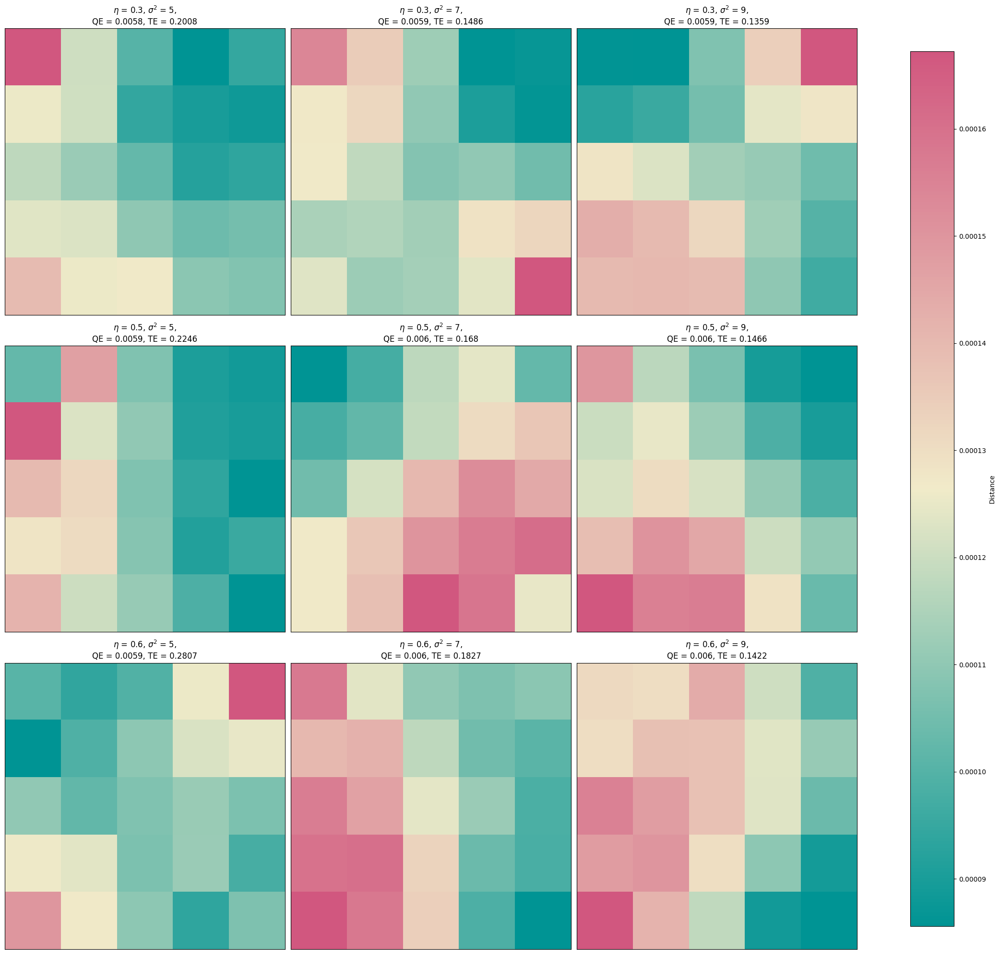

In [370]:
# SOM visualization
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(22.5, 20), subplot_kw=dict(xticks=[], yticks=[]))
param_combinations = [(lr, rsq) for lr in learn_rates for rsq in radiuses]

for s, ax, (learn_rate, radius_sq) in zip(SOMS, axes.flat, param_combinations):
    u_matrix_values = SOMlib.u_matrix(s)
    im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
    QE = round(SOMlib.calculateQE(s, n_train_data), 4)
    TE = round(SOMlib.calculateTE(s, n_train_data), 4)
    ax.set_title(f'$\eta$ = {learn_rate}, $\sigma^2$ = {radius_sq},\nQE = {QE}, TE = {TE}')

plt.tight_layout()
cbar = plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
cbar.set_label('Distance')
plt.show()

In [375]:
TE_list_all_flat = [item for sublist in TE_list_all for item in sublist]
QE_list_all_flat = [item for sublist in QE_list_all for item in sublist]

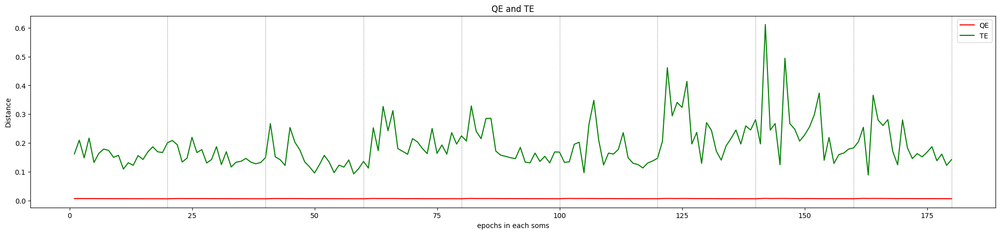

In [376]:
epochs = range(1,len(TE_list_all_flat)+1)
plt.figure(figsize=(25,5))
plt.plot(epochs, QE_list_all_flat, color='red', label='QE')
plt.plot(epochs, TE_list_all_flat, color='green', label='TE')

for i in range(20, len(epochs) + 1, 20):
    plt.axvline(x=i, linestyle='--', color='gray', linewidth=0.5)

plt.title('QE and TE')
plt.xlabel('epochs in each soms')
plt.ylabel('Distance')
plt.legend()
plt.show()

In [377]:
def save_soms(soms, filename):
    with open(filename, 'wb') as f:
        pickle.dump(soms, f)

def load_soms(filename):
    with open(filename, 'rb') as f:
        soms = pickle.load(f)
    return soms

In [381]:
save_path = '/content/drive/MyDrive/Fianl_Julian/pkl/'
save_soms(SOMS, save_path + 'SOMS_text02.pkl')

In [383]:
SOMS_text = load_soms("/content/drive/MyDrive/Fianl_Julian/pkl/SOMS_text02.pkl")

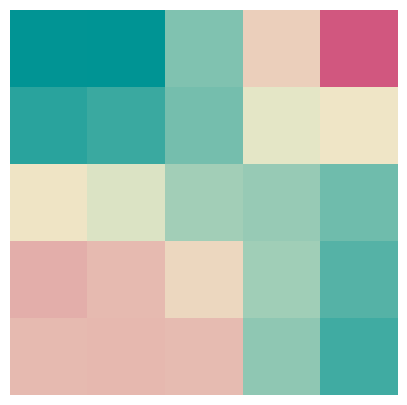

In [384]:
SOM_t = SOMS[2]

fig, ax = plt.subplots(figsize=(5, 5))
u_matrix_values = SOMlib.u_matrix(SOM_t)
im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
plt.axis('off')
plt.show()

In [385]:
# Create an empty dictionary for neuron-word mapping
neuron_word_mapping = {}

# Iterate over the SOM grid
for i in range(SOM_t.shape[0]):
    for j in range(SOM_t.shape[1]):
        # Initialize an empty list for each neuron
        neuron_word_mapping[(i, j)] = []

train_data = novel_model_lsa.vector_matrix
n_train_data = SOMlib.normalise(train_data, train_data)
# Iterate over the paragraphs and their vectors
for word, vector in zip(novel_model_lsa.paragraphs, n_train_data):
    # Find the best matching unit (BMU) for the vector
    best_matching_unit = SOMlib.find_BMU(SOM_t, vector)
    # Append the word to the list corresponding to the BMU in the neuron-word mapping dictionary
    neuron_word_mapping[best_matching_unit].append(word)

In [386]:
# Initialize a list to store the count of words in each neuron
neuron_counts = []

# Iterate over the SOM grid
for i in range(SOM_t.shape[0]):
    for j in range(SOM_t.shape[1]):
        # Append the count of words in the current neuron to the list
        neuron_counts.append(len(neuron_word_mapping[(i, j)]))

# Reshape the list to match the SOM grid shape
neuron_counts_grid = np.array(neuron_counts).reshape(SOM_t.shape[:2])

print(neuron_counts_grid)

[[310 189 155 127 277]
 [235 190 142  57 114]
 [227 191 158  88 158]
 [126  93 146 143 204]
 [291 121 235 200 311]]


## **[ TEXT ]**.3 SOM Search Engine

In [430]:
def search_textSOM(sentence, n=5):
    print("query:", sentence)

    # Vectorize the input sentence
    vectorized_sentence = np.squeeze(novel_model_lsa.vectorize(sentence))

    # Activate the SOM and find the best matching unit
    activated_SOM = SOMlib.activate(SOM_t, vectorized_sentence)
    top_index = np.argmax(activated_SOM)
    g, h = SOMlib.find_BMU(SOM_t, vectorized_sentence)
    top_coordinate = (g, h)

    # Plot the activated SOM
    fig, ax = plt.subplots(figsize=(3, 3))
    plt.imshow(activated_SOM, cmap=cmap_diverging, interpolation='none')
    plt.axis('off')
    plt.show()

    #print("best matched unit:", top_coordinate, "\n")

    # Extract the best-matched n paragraphs of the most matched cells
    SOMcontents = []
    train_data = novel_model_lsa.vector_matrix
    for i in range(len(SOM_t)):
      row = []
      for j in range(len(SOM_t[0])):
        row.append([])
      SOMcontents.append(row)
    for f, fi in zip(train_data, novel_model_lsa.paragraphs):
        g, h = SOMlib.find_BMU(SOM_t, f)
        SOMcontents[g][h].append(fi)

    matched_paragraphs = []
    similarities = {}

    # Calculate the cosine similarity between text paragraphs and the input sentence
    for paragraph_info in SOMcontents[g][h]:
        paragraph = paragraph_info['paragraph']
        paragraph_info_copy = paragraph_info.copy()
        # Vectorize the paragraph
        paragraph_vector = np.squeeze(novel_model_lsa.vectorize(paragraph))
        # Calculate cosine similarity
        similarity_score = cosine_similarity([vectorized_sentence], [paragraph_vector])
        # Store similarity score
        similarities[paragraph] = (paragraph_info_copy, similarity_score)

    # Select the most similar text paragraphs
    sorted_paragraphs = sorted(similarities.items(), key=lambda x: x[1][1], reverse=True)
    matched_paragraphs = [(paragraph_info, similarity_score) for paragraph, (paragraph_info, similarity_score) in sorted_paragraphs[:n]]
    print(matched_paragraphs)

    return matched_paragraphs


query: pythoy is a really difficult skill


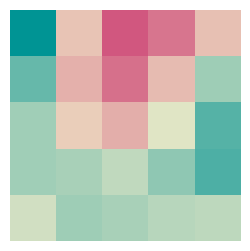

[({'paragraph': "''You touch a single hair of his and I swear I'll—''You scare me to bits, really. I just shat my pants.'Fermin swallowed, as if to hold in all the courage that was seeping out of him. 'Those wouldn't be the same sailor-boy pants that your esteemed mother, the Illustrious Kitchen Maid, made you wear? That would be a shame; I'm told the outfit really suited you.", 'nr': 1985, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.55058058]])), ({'paragraph': " Shortly after the start of the skirmish, General Goded's troops surrendered, due to a miracle or to poor communication between the commanders. Lluis Companys's government seemed to have regained control, but what really happened would become obvious in the next few weeks.", 'nr': 2816, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.42560263]])), ({'paragraph': "'You're as good as gold, Bernarda,' he would say indignantly. 'These people who see sin everywhere are sick in their souls and, if you reall

In [431]:
sentence = "pythoy is a really difficult skill"
matched_paragraphs = search_textSOM(sentence, n=5)

## **[ TEXT ]**.4  Fit PCA

After training, fit on all cells

In [ ]:
# Extract SOM dimensions and vector dimension
som_height, som_width, vector_dimension = SOM.shape
num_nodes = som_height * som_width

# Reshape SOM to a 2D array
flattened_som = SOM.reshape(num_nodes, vector_dimension)

# PCA to reduce dimensionality
pca = PCA(n_components=3)
colourComponents = pca.fit_transform(flattened_som)

In [ ]:
# Convert color components to RGB values in the range [0, 255]
colourComponents=SOMlib.normalise(colourComponents,colourComponents)
rgb_values = (colourComponents * 255).astype(int)

# Map nodes to RGB colors
som_colors = np.zeros((som_height, som_width, 3), dtype=np.uint8)
for i in range(som_height):
    for j in range(som_width):
        node_idx = i * som_width + j
        som_colors[i, j] = rgb_values[node_idx]

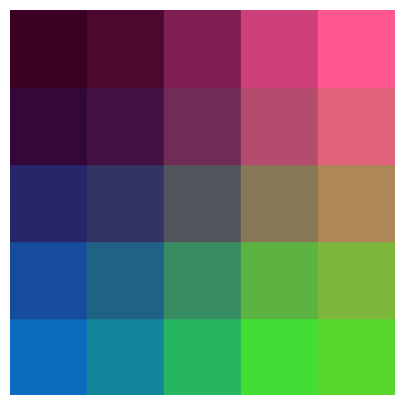

In [ ]:
fig, ax = plt.subplots(figsize=(som_width, som_height))

# Plot colored rectangles to represent SOM nodes
for i in range(som_height):
    for j in range(som_width):
        color = som_colors[i, j] / 255.0
        ax.add_patch(plt.Rectangle((j, i), 1, 1, color=color))

ax.set_xlim(0, som_width)
ax.set_ylim(0, som_height)
ax.set_aspect('equal')
ax.axis('off')
plt.show()

Befor training

In [ ]:
# Fit the PCA to novel model and transform it to color components
pca = PCA(n_components=3)
colourComponents = pca.fit_transform(novel_model_lsa.vector_matrix)

In [ ]:
# Extract the dimensions of the SOM and reshape
som_height, som_width, vector_dimension = SOM.shape
num_nodes = som_height * som_width
flattened_som = SOM.reshape(num_nodes, vector_dimension)

In [ ]:
# Transform the SOM using the already fitted PCA model
colourComponents = pca.transform(flattened_som)

colourComponents= SOMlib.normalise(colourComponents,colourComponents)

rgb_values = (colourComponents * 255).astype(int)

som_colors = np.zeros((som_height, som_width, 3), dtype=np.uint8)

for i in range(som_height):
    for j in range(som_width):
        node_idx = i * som_width + j
        som_colors[i, j] = rgb_values[node_idx]

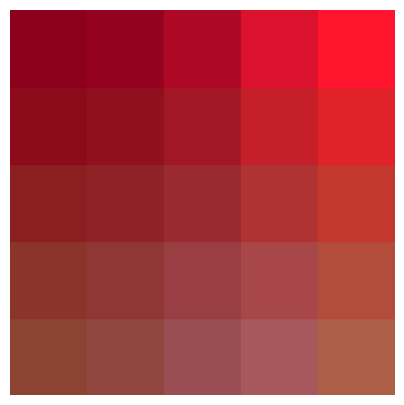

In [ ]:
fig, ax = plt.subplots(figsize=(som_width, som_height))

for i in range(som_height):
    for j in range(som_width):
        color = som_colors[i, j] / 255.0
        ax.add_patch(plt.Rectangle((j, i), 1, 1, color=color))

ax.set_xlim(0, som_width)
ax.set_ylim(0, som_height)
ax.set_aspect('equal')
ax.axis('off')
plt.show()

## **[ IMAGE ]**.1  Data preprocess

yufu, translate image to text

yufu code:https://colab.research.google.com/drive/18r6YFqWyUDLmYri99wx-UllBt7xferHW?usp=drive_link

In [520]:
def read_csv_to_dict(file_path):
    data_dict = {}
    with open(file_path, 'r', newline='') as csvfile:
        csvreader = csv.DictReader(csvfile)
        for row in csvreader:
            file_name = row['File Name']
            output = row['Output']
            data_dict[file_name] = output
    return data_dict

In [521]:
file_path = '/content/drive/MyDrive/Fianl_Julian/database/fuyu_image/image_fuyu.csv'
image_fuyu_dict = read_csv_to_dict(file_path)

vector image for som

In [522]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file,
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [523]:
model = tf.keras.applications.mobilenet.MobileNet(

  input_shape=(224, 224, 3),
  include_top=False,
  pooling='avg'
)

In [525]:
Files_Path = r'/content/drive/MyDrive/Fianl_Julian/database/image'
imageFiles = os.listdir(Files_Path)

if '.DS_Store' in imageFiles:
    imageFiles.remove('.DS_Store')

imageFiles = imageFiles[:1000]
imageFiles.sort(key=lambda x: int(re.search(r'\d+', x).group()) if re.search(r'\d+', x) else float('inf'))

features = []
for m in imageFiles:
    path = os.path.join(Files_Path, m)
    f = processImage(path, model)
    features.append(f)


1/1 [==============================] - 0s 61ms/step


In [526]:
featureImagePairs = []
for i in range(len(features)):
    featureImage = {}
    featureImage['image'] = imageFiles[i]
    featureImage['feature'] = features[i]
    featureImagePairs.append(featureImage)

In [527]:
# Add yufu description to featureImagePairs
for key, value in image_fuyu_dict.items():
    for pair in featureImagePairs:
        if pair['image'] == key:
            pair['description'] = value
            break

featureImagePairs[1:3]

[{'image': 'phote_2.jpg',
  'feature': array([0.03798443, 0.03833099, 0.01597962, ..., 0.01996922, 0.05202413,
         1.3070278 ], dtype=float32),
  'description': 'There were two houses in a square with a fountain spraying water in front of them'},
 {'image': 'phote_3.jpg',
  'feature': array([0.05171721, 2.2878964 , 0.30345583, ..., 1.3031312 , 0.52447426,
         1.0002964 ], dtype=float32),
  'description': 'In the picture, there is a large cityscape with buildings, a street, and cars. The scene is black and white, emphasizing the vintage or historical atmosphere.\n'}]

## **[ IMAGE ]**.2  SOM Training

In [528]:
import SOM_Euclid as SOMEuc

In [529]:
SOMS_image = []
learn_rates = [0.3, 0.5, 0.6]
radiuses = [5, 7, 9]
m, n = 5, 5

for learn_rate in learn_rates:
    for radius in radiuses:
        rand = np.random.RandomState(0)
        train_data = features
        n_train_data = SOMEuc.normalise(train_data, train_data)

        SOM = rand.uniform(0, 1, (m, n, len(train_data[0])))
        SOM = SOMEuc.train_SOM(SOM, n_train_data, epochs=20, learn_rate=learn_rate, radius_sq=radius)

        SOMS_image.append(SOM)

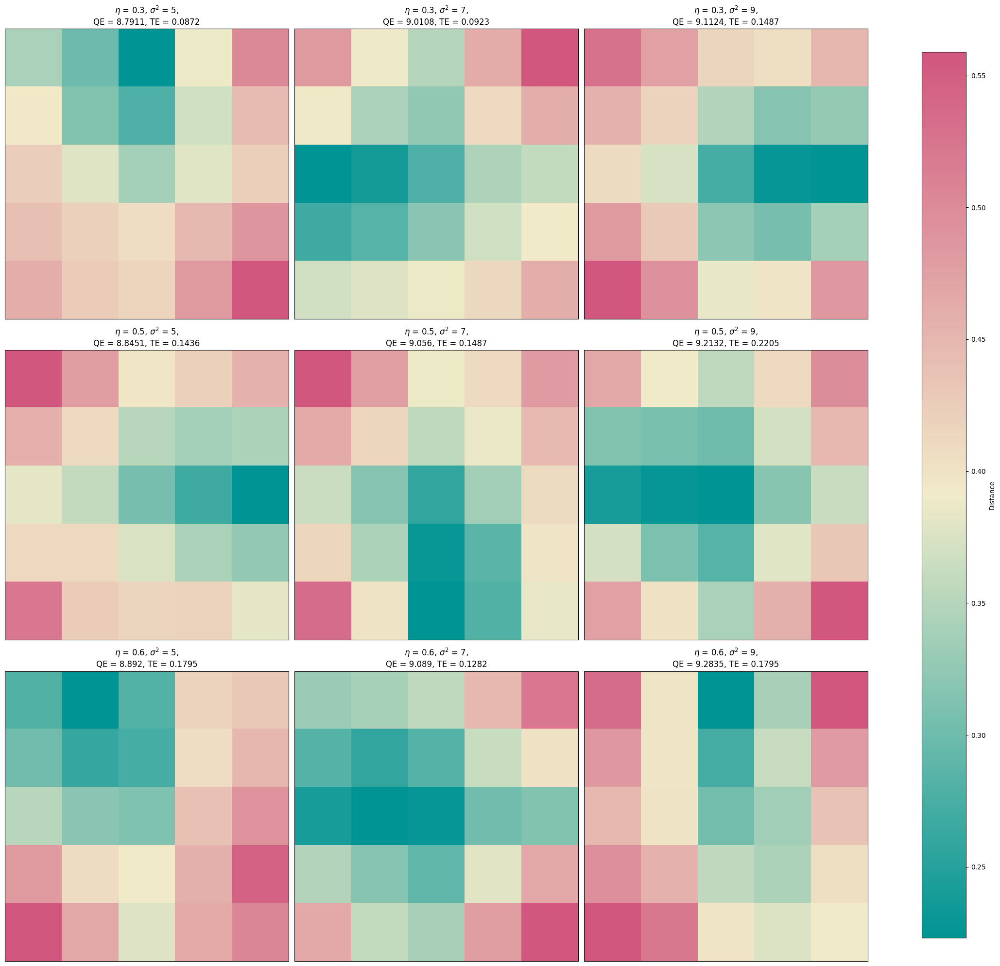

In [530]:
# SOM visualization
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(22.5, 20), subplot_kw=dict(xticks=[], yticks=[]))
param_combinations = [(lr, rsq) for lr in learn_rates for rsq in radiuses]

for s, ax, (learn_rate, radius_sq) in zip(SOMS_image, axes.flat, param_combinations):
    u_matrix_values = SOMEuc.u_matrix(s)
    im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
    QE = round(SOMEuc.calculateQE(s, n_train_data), 4)
    TE = round(SOMEuc.calculateTE(s, n_train_data), 4)
    ax.set_title(f'$\eta$ = {learn_rate}, $\sigma^2$ = {radius_sq},\nQE = {QE}, TE = {TE}')

plt.tight_layout()
cbar = plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
cbar.set_label('Distance')
plt.show()

In [ ]:
save_path = '/content/drive/MyDrive/Fianl_Julian/pkl/'
save_soms(SOMS_image, save_path + 'SOMS_image01.pkl')

In [ ]:
SOMS_image = load_soms("/content/drive/MyDrive/Fianl_Julian/pkl/SOMS_image01.pkl")

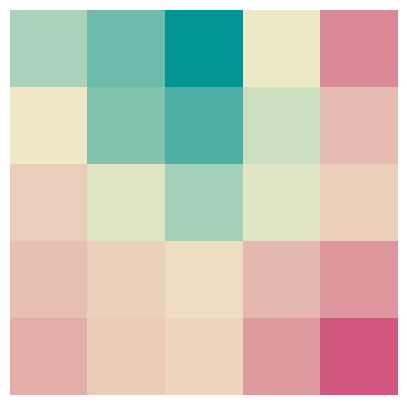

In [531]:
SOM_i = SOMS_image[0]

fig, ax = plt.subplots(figsize=(5, 5))
u_matrix_values = SOMEuc.u_matrix(SOM_i)
im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
plt.axis('off')
plt.show()

In [532]:
# Make sure that the SOMimages list matches the dimensions of the SOM
SOMimages = []
for i in range(len(SOM_i)):
    row = []
    for j in range(len(SOM_i[0])):
        row.append([])
    SOMimages.append(row)

train_data = features
# Each feature vector is associated with BMU
for fi in featureImagePairs:
    g,h = SOMEuc.find_BMU(SOM_i, SOMEuc.normalise(train_data, fi['feature']))
    SOMimages[g][h].append(fi)

In [533]:
[[len(c) for c in r] for r in SOMimages]

[[15, 3, 6, 7, 15],
 [8, 4, 4, 6, 10],
 [11, 9, 7, 4, 8],
 [7, 2, 4, 6, 9],
 [12, 7, 9, 10, 12]]

In [534]:
SOMimages[0][0][1]

{'image': 'phote_49.jpg',
 'feature': array([0.92219794, 0.79071766, 0.11017016, ..., 0.34587812, 0.75647587,
        1.3560144 ], dtype=float32),
 'description': 'In the picture, there is a busy marketplace with many people walking around and shopping. The scene captures an outdoor marketplace with tents and awnings, creating a lively atmosphere.\n\nThere are numerous people walking around and shopping, some carrying handbags and backpacks. There are numerous tents and awnings throughout the marketplace, providing shade and shelter to the shoppers. The marketplace is bustling with activity, with people going about their daily routines and engaging in shopping activities.'}

In [535]:
SOM_i[0][0]

array([0.08146816, 0.34008479, 0.02341413, ..., 0.1862758 , 0.05432415,
       0.04241401])

## **[ IMAGE ]**.3  Mapping image on SOM

In [536]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

def get_closest_image(a,b):
  cell = SOM_i[a][b]
  distance = [distance_between(cell, i['feature']) for i in SOMimages[a][b]]
  closest_image_index = find_closest_image_index(distance)
  return closest_image_index

def img_reshape(img):
    img_path = os.path.join(Files_Path, img)
    img = Image.open(img_path).convert('RGB')
    img = img.resize((100, 100))
    img = np.asarray(img)
    return img

In [537]:
imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            #Find the image closest to the SOM vector
            closest_image_index=get_closest_image(g,h)
            imageGrid.append(cell[closest_image_index]['image'])
        else:
            imageGrid.append('white.png')

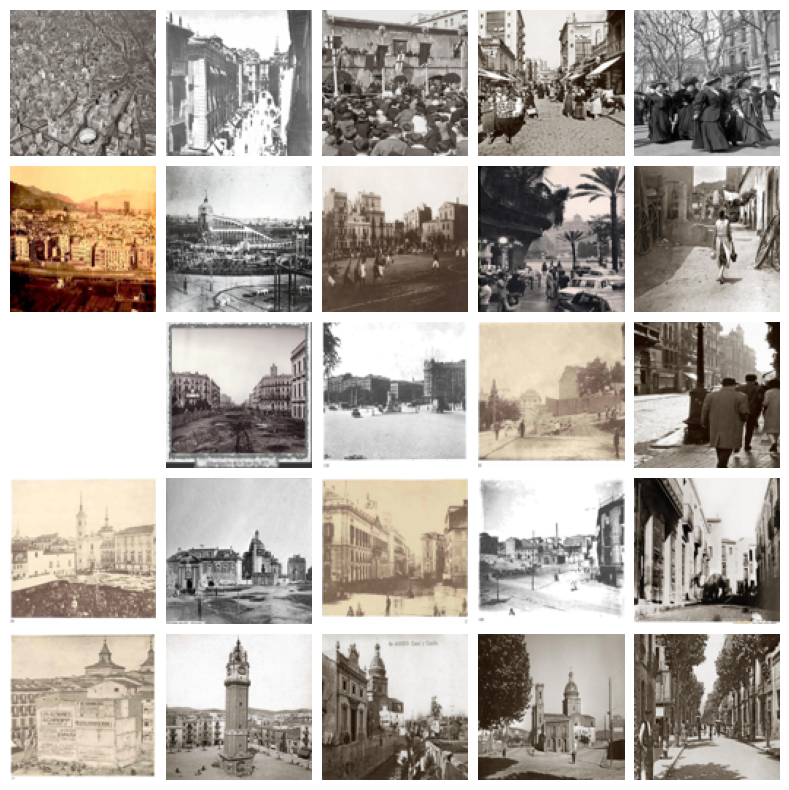

In [538]:
img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(10., 10.))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

## **[ IMAGE ]**.4  SOM Search Engine

input image, search in SOM

In [539]:
def search_imageSOM(query_image_Path):

    query_image_name = os.path.basename(query_image_Path)
    path_prefix = "/content/drive/MyDrive/Fianl_Julian/database/image/"
    query_feature = processImage(query_image_Path, model)

    activatedSOM = SOMEuc.activate(train_data, SOM_i, query_feature)
    g, h = SOMEuc.find_BMU(SOM_i, query_feature)
    #print(g,h)
    closest_image_index = get_closest_image(g, h)
    closest_image_path = path_prefix + cell[closest_image_index]['image']
    #print(cell[closest_image_index])

    query_image = mpimg.imread(query_image_Path)
    closest_image = mpimg.imread(closest_image_path)

    # Display the images
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(query_image)
    axs[0].set_title('Query Image\n' + query_image_name)
    axs[0].axis('off')
    axs[1].imshow(activatedSOM, cmap=cmap_diverging)
    axs[1].set_title('SOM Activation')
    axs[1].axis('off')
    axs[2].imshow(closest_image)
    axs[2].set_title('Closest Image\n' + cell[closest_image_index]['image'])
    axs[2].axis('off')
    plt.show()
    print("Description of the closest image:", cell[closest_image_index]['description'])

    return cell[closest_image_index]

1/1 [==============================] - 0s 60ms/step
2 0
{'image': 'phote_164.jpg', 'feature': array([1.2842503, 2.5903504, 0.       , ..., 1.6721249, 0.139164 ,
       0.       ], dtype=float32), 'description': 'A group of men, women, and children standing and walking on a sidewalk'}


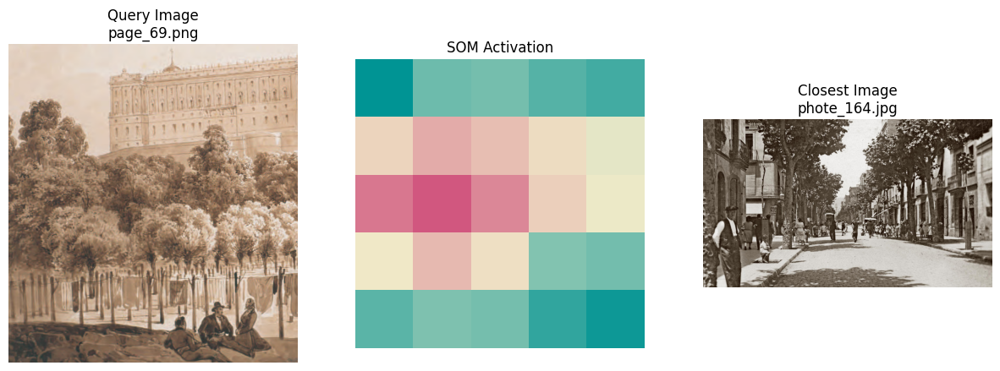

Description of the closest image: A group of men, women, and children standing and walking on a sidewalk


In [425]:
# Example usage:
query_image_Path = "/content/drive/MyDrive/Fianl_Julian/database/input_image/page_69.png"

closest_info = search_imageSOM(query_image_Path)

In [54]:
cell[closest_image_index]

{'image': 'phote_96.jpg',
 'feature': array([1.0701654 , 3.6848168 , 0.68073356, ..., 0.4020106 , 0.7361557 ,
        0.5210956 ], dtype=float32),
 'description': 'In the picture, a group of women is walking down a street, dressed in long dresses and wearing hats. They are holding umbrellas, possibly to protect themselves from the sun or rain.\n'}

input text, search in fuyu_csv

In [117]:
def show_fuyu_results(search_results):
    for result in search_results:
        paragraph = result['paragraph']
        image_id = result['ID']
        image_path = f"/content/drive/MyDrive/Fianl_Julian/database/image/{image_id}"

        image = mpimg.imread(image_path)
        plt.figure(figsize=(3.5, 3.5))
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        print("file name:", image_id)
        print("Paragraph:", paragraph)
        print("---------------")
    return image_id

In [56]:
CSV_DIR='/content/drive/MyDrive/Fianl_Julian/database/fuyu_image'
CSV_FILES = []
CSV_FILES.extend(glob.glob(os.path.join(CSV_DIR, '*')))

In [57]:
CSV_model = TextModel(CSV_FILES,vectorization='lsa',min_df=3)

In [58]:
CSV_model.paragraphs[0]

{'paragraph': 'In the image, a group of people is walking down a street on a rainy day. The street is wet, and people are wearing coats and hats as they navigate the area. There are at least ten people visible in the scene, some walking closer together,',
 'nr': 1,
 'ID': 'phote_163.jpg',
 'type': 'csv'}

In [59]:
fuyu_search_result = CSV_model.search('memory in madrid likes a dream', n=3)

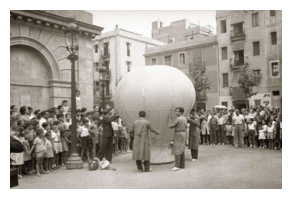

file name: phote_138.jpg
Paragraph: In the picture, there is a large crowd of people standing next to a lamppost. Among them, a man is holding a large object, possibly an object like an inflatable balloon or a globe, while a crowd of people watches him.

---------------


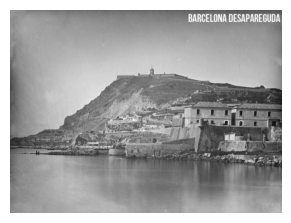

file name: phote_73.jpg
Paragraph: ?

In the picture, you can see a town situated on a mountain top with a castle-like building.

---------------


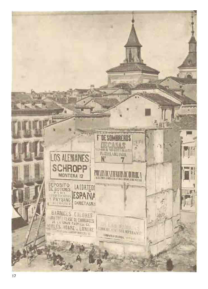

file name: phote_13.jpg
Paragraph: In the picture, there is a large white building with Spanish writing on it. The building is surrounded by other buildings, including a hotel and a hotel-like structure.

---------------


In [60]:
show_fuyu_results(fuyu_search_result)

## **[ VIDEO ]**.1  Data preprocess

extravt film screenshot, each 5s

In [289]:
def extract_screenshot(film_FILES, screenshot_path):
    screenshots_info = []

    for fi in film_FILES:
        cap = cv2.VideoCapture(fi)
        frame_interval = 120
        frame_count = 0
        filename, file_extension = os.path.splitext(os.path.basename(fi))

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            if frame_count % frame_interval == 0:
                filename_without_extension = os.path.splitext(filename)[0]
                image_name = f'{filename_without_extension}_{frame_count}.jpg'
                image_path = os.path.join(screenshot_path, image_name)
                #cv2.imwrite(image_path, frame)

                screenshots_info.append({'frame_count': frame_count, 'image': image_name, 'film_name': f"{filename}{file_extension}"})

            frame_count += 1

        cap.release()

    return screenshots_info


In [64]:
film_DIR='/content/drive/MyDrive/Fianl_Julian/database/video'
film_FILES = []
film_FILES.extend(glob.glob(os.path.join(film_DIR, '*')))

screenshot_path = '/content/drive/MyDrive/Fianl_Julian/database/film_screenshot'

In [ ]:
screenshots_info = extract_screenshot (film_FILES, screenshot_path)

In [ ]:
screenshots_info[24:30]

[{'frame_count': 2880,
  'image': 'All_About_My_Mother_2880.jpg',
  'film_name': 'All_About_My_Mother.mkv'},
 {'frame_count': 3000,
  'image': 'All_About_My_Mother_3000.jpg',
  'film_name': 'All_About_My_Mother.mkv'},
 {'frame_count': 3120,
  'image': 'All_About_My_Mother_3120.jpg',
  'film_name': 'All_About_My_Mother.mkv'},
 {'frame_count': 3240,
  'image': 'All_About_My_Mother_3240.jpg',
  'film_name': 'All_About_My_Mother.mkv'},
 {'frame_count': 3360,
  'image': 'All_About_My_Mother_3360.jpg',
  'film_name': 'All_About_My_Mother.mkv'},
 {'frame_count': 3480,
  'image': 'All_About_My_Mother_3480.jpg',
  'film_name': 'All_About_My_Mother.mkv'}]

extract subtitle from .srt files

In [ ]:
def parse_subtitle_file(subtitle_file):
    subtitles = []
    with open(subtitle_file, 'r', encoding='utf-8') as file:
        lines = file.readlines()
        subtitle_info = {}
        for line in lines:
            line = line.strip()
            if re.match(r'^\d+$', line):
                if subtitle_info:
                    subtitles.append(subtitle_info)
                    subtitle_info = {}
                subtitle_info['paragraph'] = ''
                subtitle_info['nr'] = int(line)
            elif re.match(r'^\d\d:\d\d:\d\d,\d\d\d --> \d\d:\d\d:\d\d,\d\d\d$', line):  # 匹配时间戳
                start_time, end_time = line.split(' --> ')
                subtitle_info['time'] = (time_to_frame(start_time), time_to_frame(end_time))
            elif line:
                subtitle_info['paragraph'] += line + ' '
        if subtitle_info:
            subtitles.append(subtitle_info)
    return subtitles

def time_to_frame(time_str, fps=24):
    parts = time_str.split(':')
    hours = int(parts[0])
    minutes = int(parts[1])
    seconds, milliseconds = map(int, re.split(r'[,.]', parts[2]))
    total_seconds = hours * 3600 + minutes * 60 + seconds + milliseconds / 1000
    total_frames = total_seconds * fps
    return int(total_frames)

In [ ]:
subtitle_file = '/content/drive/MyDrive/Fianl_Julian/database/video/All_About_My_Mother.srt'
subtitles = parse_subtitle_file(subtitle_file)

for subtitle in subtitles[:5]:
    print(subtitle)

{'paragraph': "I'm going to call. ", 'nr': 1, 'time': (3051, 3103)}
{'paragraph': 'TRANSPLANT COORDINATION ', 'nr': 2, 'time': (3157, 3205)}
{'paragraph': 'National Transplant Organization. ', 'nr': 3, 'time': (3486, 3541)}
{'paragraph': '- Manuela, Ramón y Cajal Hospital. - Yes. ', 'nr': 4, 'time': (3542, 3598)}
{'paragraph': "We've got a possible donor. ", 'nr': 5, 'time': (3599, 3650)}


Merge subtitle information with screenshot information

In [ ]:
screenshotsPairs = copy.deepcopy(screenshots_info)

#Add subtitles to the screenshot_info
for screenshot in screenshotsPairs:
    a = screenshot['frame_count']
    paragraphs = []
    for subtitle in subtitles:
        b, c = subtitle['time']
        if a + 120 - b > c - a - 120 and b > a:
            paragraphs.append(subtitle['paragraph'])
    if paragraphs:
        screenshot['paragraph'] = ' '.join(paragraphs)
    else:
        screenshot['paragraph'] = " "

In [ ]:
screenshotsPairs[24:30]

[{'frame_count': 2880,
  'image': 'All_About_My_Mother_2880.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': ' '},
 {'frame_count': 3000,
  'image': 'All_About_My_Mother_3000.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': "I'm going to call. "},
 {'frame_count': 3120,
  'image': 'All_About_My_Mother_3120.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': 'TRANSPLANT COORDINATION '},
 {'frame_count': 3240,
  'image': 'All_About_My_Mother_3240.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': ' '},
 {'frame_count': 3360,
  'image': 'All_About_My_Mother_3360.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': ' '},
 {'frame_count': 3480,
  'image': 'All_About_My_Mother_3480.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': 'National Transplant Organization.  - Manuela, Ramón y Cajal Hospital. - Yes. '}]

In [ ]:
save_path = '/content/drive/MyDrive/Fianl_Julian/output/'
save_soms(screenshotsPairs, save_path + 'screenshotsPairs01.pkl')

In [61]:
screenshotsPairs = load_soms("/content/drive/MyDrive/Fianl_Julian/output/screenshotsPairs01.pkl")

In [65]:
# Extract screenshoots features
imageFiles = os.listdir(screenshot_path)
if '.DS_Store' in imageFiles:
    imageFiles.remove('.DS_Store')

imageFiles.sort(key=lambda x: int(re.search(r'\d+', x).group()) if re.search(r'\d+', x) else float('inf'))

screenshot_features = []
for m in imageFiles:
    path = os.path.join(screenshot_path, m)
    f = processImage(path, model)
    screenshot_features.append(f)

1/1 [==============================] - 0s 89ms/step


In [66]:
screenshot_features[1]

array([2.9695803e-02, 9.5605928e-01, 6.7770159e-01, ..., 3.9332718e-01,
       6.7777000e-02, 4.1133529e-04], dtype=float32)

In [70]:
# Add features in new dic
clipsPairsFeature = copy.deepcopy(screenshotsPairs)

featureImagePairs = []
for i in range(len(screenshot_features)):
    featureImage = {}
    featureImage['image'] = imageFiles[i]
    featureImage['feature'] = screenshot_features[i]
    featureImagePairs.append(featureImage)

for featureImage in featureImagePairs:
    for screenshot in clipsPairsFeature:
        if featureImage['image'] == screenshot['image']:
            screenshot['feature'] = featureImage['feature']
            break


In [71]:
clipsPairsFeature[24:27]

[{'frame_count': 2880,
  'image': 'All_About_My_Mother_2880.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': ' ',
  'feature': array([0.54660475, 0.11187976, 0.86779994, ..., 0.2247148 , 1.2517923 ,
         0.69793344], dtype=float32)},
 {'frame_count': 3000,
  'image': 'All_About_My_Mother_3000.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': "I'm going to call. ",
  'feature': array([1.6628255 , 0.11484616, 0.17633484, ..., 0.9095515 , 2.4134054 ,
         0.6958458 ], dtype=float32)},
 {'frame_count': 3120,
  'image': 'All_About_My_Mother_3120.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': 'TRANSPLANT COORDINATION ',
  'feature': array([1.1568251 , 0.22795494, 0.5901655 , ..., 0.5252316 , 2.8821852 ,
         0.28715444], dtype=float32)}]

## **[ VIDEO ]**.2  SOM Training of screenshots

In [72]:
import SOM_Euclid as SOMEuc

In [290]:
SOMS_screenshoot = []
learn_rates = [0.3, 0.5, 0.6]
radiuses = [3, 7, 9]
m, n = 5, 5

for learn_rate in learn_rates:
    for radius in radiuses:
        rand = np.random.RandomState(0)
        train_data = screenshot_features
        n_train_data = SOMEuc.normalise(train_data, train_data)

        SOM = rand.uniform(0, 1, (m, n, len(train_data[0])))
        SOM = SOMEuc.train_SOM(SOM, n_train_data, epochs=20, learn_rate=learn_rate, radius_sq=radius)

        SOMS_screenshoot.append(SOM)

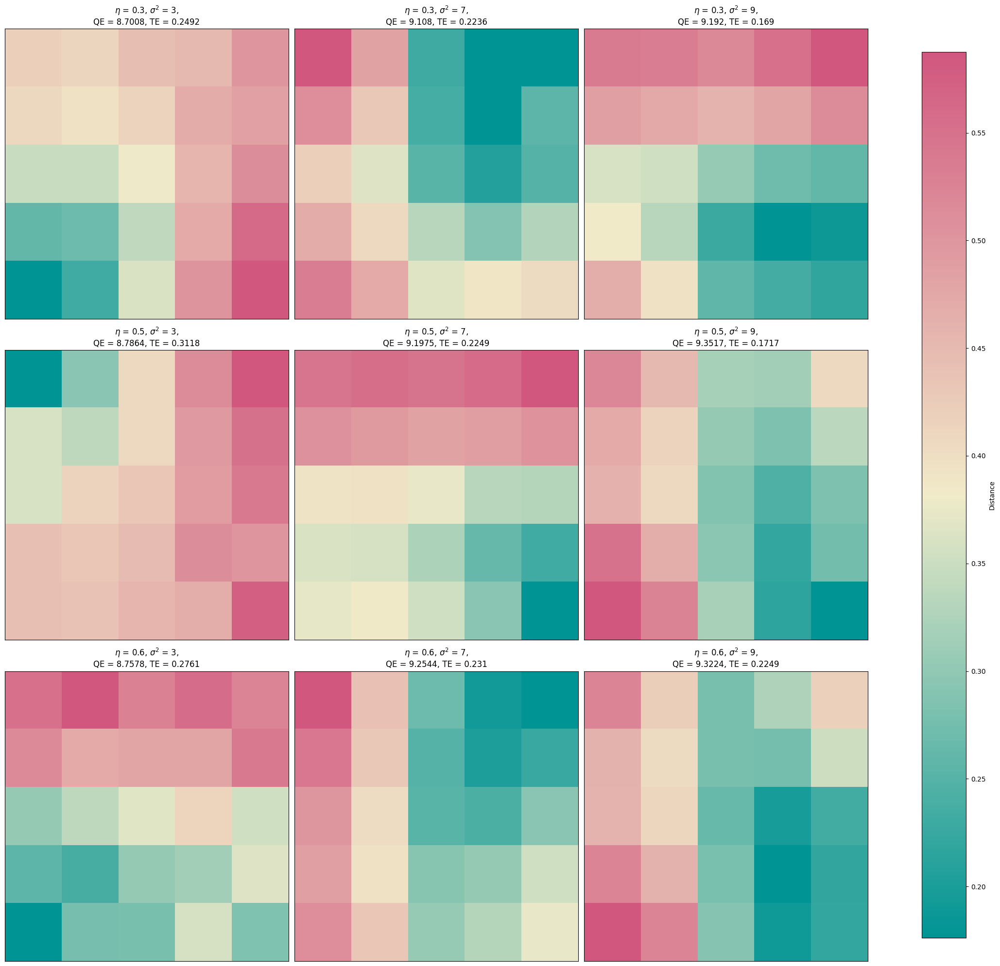

In [291]:
# SOM visualization
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(22.5, 20), subplot_kw=dict(xticks=[], yticks=[]))
param_combinations = [(lr, rsq) for lr in learn_rates for rsq in radiuses]

for s, ax, (learn_rate, radius_sq) in zip(SOMS_screenshoot, axes.flat, param_combinations):
    u_matrix_values = SOMEuc.u_matrix(s)
    im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
    QE = round(SOMEuc.calculateQE(s, n_train_data), 4)
    TE = round(SOMEuc.calculateTE(s, n_train_data), 4)
    ax.set_title(f'$\eta$ = {learn_rate}, $\sigma^2$ = {radius_sq},\nQE = {QE}, TE = {TE}')

plt.tight_layout()
cbar = plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
cbar.set_label('Distance')
plt.show()

In [292]:
save_path = '/content/drive/MyDrive/Fianl_Julian/pkl/'
save_soms(SOMS_screenshoot, save_path + 'SOMS_video02.pkl')

In [73]:
SOMS_screenshoot = load_soms("/content/drive/MyDrive/Fianl_Julian/pkl/SOMS_video02.pkl")

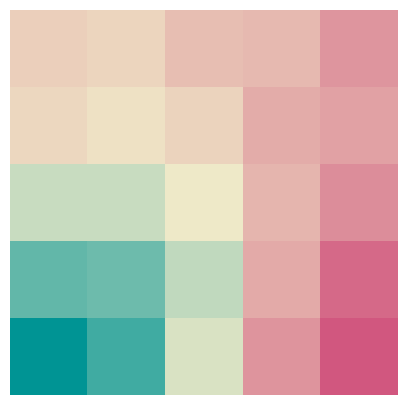

In [293]:
SOM_v = SOMS_screenshoot[0]

fig, ax = plt.subplots(figsize=(5, 5))
u_matrix_values = SOMEuc.u_matrix(SOM_v)
im = ax.imshow(u_matrix_values, cmap_diverging, aspect='auto')
plt.axis('off')
plt.show()

In [294]:
# Make sure that the SOMimages list matches the dimensions of the SOM
SOMframe = []
for i in range(len(SOM_v)):
    row = []
    for j in range(len(SOM_v[0])):
        row.append([])
    SOMframe.append(row)

train_data = screenshot_features
# Each feature vector is associated with BMU
for fi in clipsPairsFeature:
    g,h = SOMEuc.find_BMU(SOM_v, SOMEuc.normalise(train_data, fi['feature']))
    SOMframe[g][h].append(fi)

In [295]:
[[len(c) for c in r] for r in SOMframe]

[[35, 45, 52, 57, 67],
 [49, 30, 47, 46, 76],
 [49, 37, 37, 58, 70],
 [47, 31, 31, 45, 58],
 [54, 36, 21, 50, 91]]

In [296]:
SOMframe[0][0][1]

{'frame_count': 7920,
 'image': 'All_About_My_Mother_7920.jpg',
 'film_name': 'All_About_My_Mother.mkv',
 'paragraph': 'I found a picture. ',
 'feature': array([1.1253593 , 0.2364043 , 0.        , ..., 0.03890799, 0.2793869 ,
        0.11497653], dtype=float32)}

## **[ VIDEO ]**.3  Mapping screenshoots on SOM

In [299]:
# reloade each time

def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

def get_closest_frame(a,b):
  cell_frame = SOM_v[a][b]
  distance = [distance_between(cell_frame, i['feature']) for i in SOMframe[a][b]]
  closest_image_index = find_closest_image_index(distance)
  return closest_image_index

def img_reshape(img):
    img_path = os.path.join(screenshot_path, img)
    img = Image.open(img_path).convert('RGB')
    img = img.resize((100, 100))
    img = np.asarray(img)
    return img

In [300]:
imageGrid = []
for g in range(len(SOMframe)):
    row = SOMframe[g]
    for h in range(len(row)):
        cell_frame = row[h]
        if len(cell_frame) > 0:
            #Find the image closest to the SOM vector
            closest_image_index=get_closest_frame(g,h)
            imageGrid.append(cell_frame[closest_image_index]['image'])
        else:
            imageGrid.append('white.png')

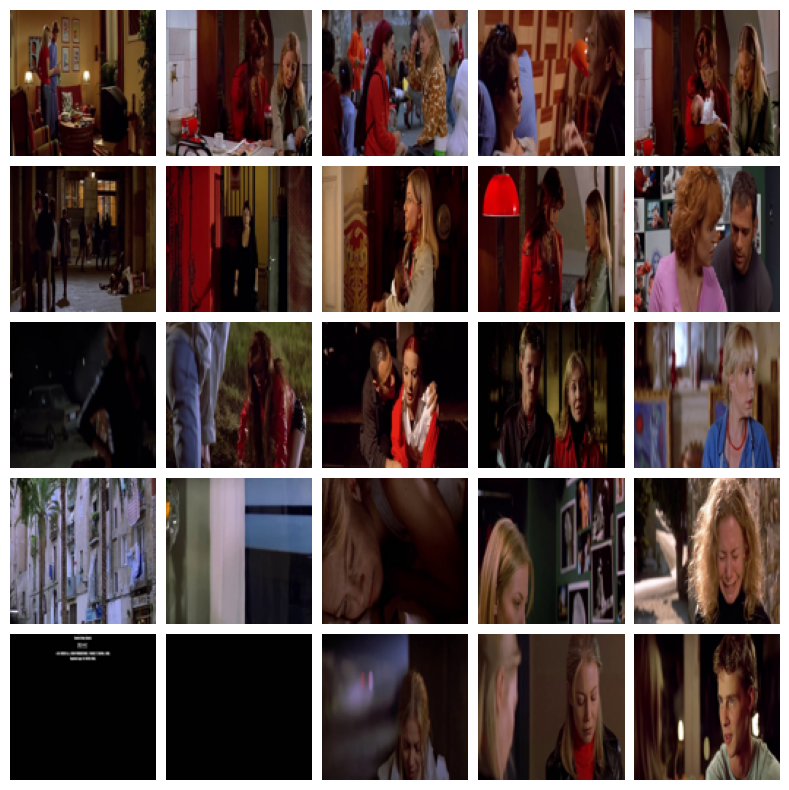

In [301]:
img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(10., 10.))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

## **[ VIDEO ]**.4  SOM Search Engine

input image, search in SOM

In [302]:
def extract_video_clip(video_path, start_frame, end_frame, output_path):

    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    for i in range(start_frame, end_frame):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ret, frame = cap.read()
        if not ret:
            break
        out.write(frame)

    cap.release()
    out.release()

    print(f"Video clip extracted and saved to {output_path}")

In [321]:
def search_videoSOM(query_image_Path, outputname):
    query_image_name = os.path.basename(query_image_Path)
    path_prefix = "/content/drive/MyDrive/Fianl_Julian/database/film_screenshot/"
    query_feature = processImage(query_image_Path, model)

    train_data = screenshot_features
    activatedSOM = SOMEuc.activate(train_data, SOM_v, query_feature)
    a, b = SOMEuc.find_BMU(SOM_v, SOMEuc.normalise(train_data, query_feature))
    #a, b = SOMEuc.find_BMU(SOM_v, query_feature)
    #print(a,b)

    closest_image_index = get_closest_frame(a, b)
    closest_image_path = path_prefix + cell_frame[closest_image_index]['image']
    #print(closest_image_path)

    query_image = mpimg.imread(query_image_Path)
    closest_image = mpimg.imread(closest_image_path)

    # Display the images
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(query_image)
    axs[0].set_title('Query Image\n' + query_image_name)
    axs[0].axis('off')
    axs[1].imshow(activatedSOM, cmap=cmap_diverging)
    axs[1].set_title('SOM Activation')
    axs[1].axis('off')
    axs[2].imshow(closest_image)
    axs[2].set_title('Closest Frame\n' + cell_frame[closest_image_index]['image'])
    axs[2].axis('off')
    plt.show()
    print("subtitle:", cell_frame[closest_image_index]['paragraph'])

    # Get the closest image frame count
    closest_frame_count = cell_frame[closest_image_index]['frame_count']

    # Load the film
    film_path_prefix = "/content/drive/MyDrive/Fianl_Julian/database/video/"
    film_name = cell_frame[closest_image_index]['film_name']
    video_path = film_path_prefix + film_name

    # Calculate end frame
    end_frame = closest_frame_count + 120

    # Output path with unique filename based on query image name and timestamp
    output_filename = f"{outputname}_{query_image_name}_{closest_frame_count}_{end_frame}.mp4"
    output_path = os.path.join("/content/drive/MyDrive/Fianl_Julian/output_clips/", output_filename)

    extract_video_clip(video_path, closest_frame_count, end_frame, output_path)

    return cell_frame[closest_image_index]

1/1 [==============================] - 0s 58ms/step


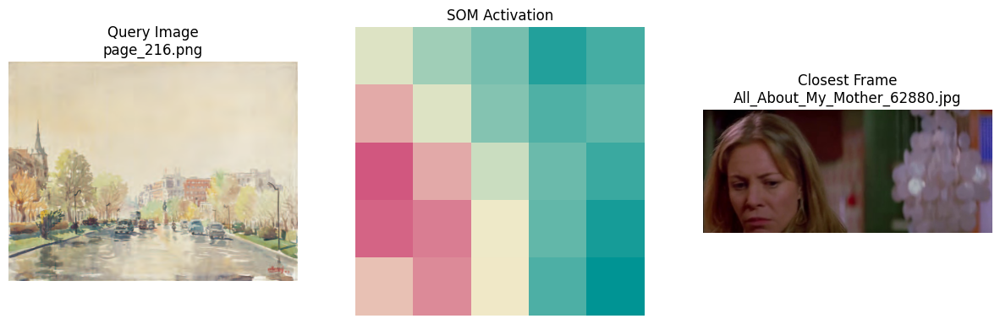

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/test_page_216.png_62880_63000.mp4


In [322]:
# Example usage:
query_image_Path = "/content/drive/MyDrive/Fianl_Julian/database/input_image/page_216.png"

closest_info = search_videoSOM(query_image_Path,"test")

input text, search in subtitles

In [344]:
def show_frame_results(search_results, outputname):
    for result in search_results:
        paragraph = result['paragraph']
        image_id = result['image']
        image_path = f"/content/drive/MyDrive/Fianl_Julian/database/film_screenshot/{image_id}"
        film_path_prefix = "/content/drive/MyDrive/Fianl_Julian/database/video/"
        film_name = result['film_name']
        video_path = film_path_prefix + film_name

        closest_frame_count = result['frame_count']
        end_frame = closest_frame_count + 120

        image = mpimg.imread(image_path)
        plt.figure(figsize=(3.5, 3.5))
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        print("frame:", image_id)
        print("Paragraph:", paragraph)

        output_filename = f"{outputname}_{closest_frame_count}_{end_frame}.mp4"
        output_path = os.path.join("/content/drive/MyDrive/Fianl_Julian/output_clips/", output_filename)
        extract_video_clip(video_path, closest_frame_count, end_frame, output_path)
        print("---------------")

In [345]:
pkl_text_DIR='/content/drive/MyDrive/Fianl_Julian/output'
pkl_text_FILES = []
pkl_text_FILES.extend(glob.glob(os.path.join(pkl_text_DIR, '*')))

In [346]:
pkl_text_model = TextModel(pkl_text_FILES,vectorization='lsa',min_df=1)

In [347]:
pkl_text_model.paragraphs[0]

{'frame_count': 0,
 'image': 'All_About_My_Mother_0.jpg',
 'film_name': 'All_About_My_Mother.mkv',
 'paragraph': ' '}

In [348]:
test_search_film_results = pkl_text_model.search('night like a dream', n=3)

In [350]:
test_search_film_results

[{'frame_count': 111120,
  'image': 'All_About_My_Mother_111120.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': 'If I bore you, you can pretend to snore... like this. '},
 {'frame_count': 130440,
  'image': 'All_About_My_Mother_130440.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': "or what he's like...  or how he behaved towards her. "},
 {'frame_count': 60840,
  'image': 'All_About_My_Mother_60840.jpg',
  'film_name': 'All_About_My_Mother.mkv',
  'paragraph': 'This late?  I was out late last night. '}]

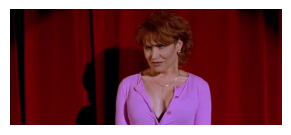

frame: All_About_My_Mother_111120.jpg
Paragraph: If I bore you, you can pretend to snore... like this. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/testsubtitle_111120_111240.mp4
---------------


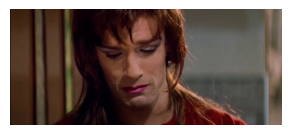

frame: All_About_My_Mother_130440.jpg
Paragraph: or what he's like...  or how he behaved towards her. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/testsubtitle_130440_130560.mp4
---------------


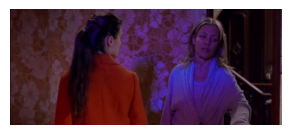

frame: All_About_My_Mother_60840.jpg
Paragraph: This late?  I was out late last night. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/testsubtitle_60840_60960.mp4
---------------


In [351]:
show_frame_results(test_search_film_results,"testsubtitle")

# **Examples searching between 3 domains**

## [01] input **text** to text — image — video

In [305]:
def from_text_search(query, outFilmName):
    # text to text
    query_1 = search_textSOM(query, n=1)[0][0]['paragraph']

    # text to image
    imagename = show_fuyu_results(CSV_model.search(query_1, n=1))

    # Construct query path
    query_2 = f"/content/drive/MyDrive/Fianl_Julian/database/image/{imagename}"

    # image to video
    test_search_film_info = search_videoSOM(query_2, outFilmName)

    return test_search_film_info

Activate with 10 inputs

In [310]:
query_list = ["The sun rose over the horizon, casting its golden rays across the tranquil meadow, as birds chirped in harmony, welcoming the new day.",
        "In the world of finance, market volatility can create opportunities for savvy investors to capitalize on fluctuations and generate profits.",
        "The scientist carefully observed the reaction under the microscope, noting the subtle changes in color and composition as the experiment progressed.",
        "As the chef meticulously plated the dish, he garnished it with fresh herbs and drizzled a delicate sauce, transforming the ingredients into a culinary masterpiece.",
        "The protagonist of the novel embarked on a perilous journey through uncharted lands, facing challenges and discovering hidden truths along the way.",
        "In the realm of technology, innovation drives progress, with each breakthrough paving the way for new possibilities and advancements.",
        "The artist stood back to admire the masterpiece on the canvas, marvelling at how each brushstroke conveyed emotion and depth.",
        "Amidst the hustle and bustle of the city streets, the weary traveler found solace in the quietude of a quaint café, sipping coffee and watching the world go by.",
        "The courtroom fell silent as the judge delivered the verdict, the tension palpable as the fate of the accused hung in the balance.",
        "As the final notes of the symphony faded into the night, the audience erupted into applause, moved by the music's haunting beauty and emotional resonance."]


 ------[ SEARCHING EXAMPLE 1 ]------------------------------------------------------------

query: The sun rose over the horizon, casting its golden rays across the tranquil meadow, as birds chirped in harmony, welcoming the new day.


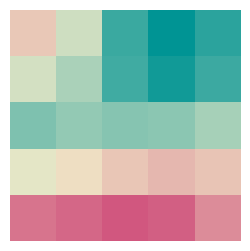

best matched unit: (4, 2) 

[({'paragraph': ' You could not be upset about anything on a day like that. That was the last day before the fiesta. 15 At noon of Sunday, the 6th of July, the fiesta exploded. There is no other way to describe it. People had been coming in all day from the country, but they were assimilated in the town and you did not notice them.', 'nr': 879, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.47819719]]))]


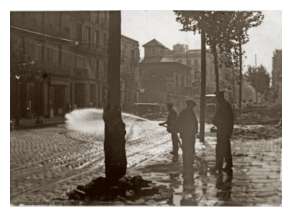

file name: phote_153.jpg
Paragraph: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.

---------------
1/1 [==============================] - 0s 57ms/step


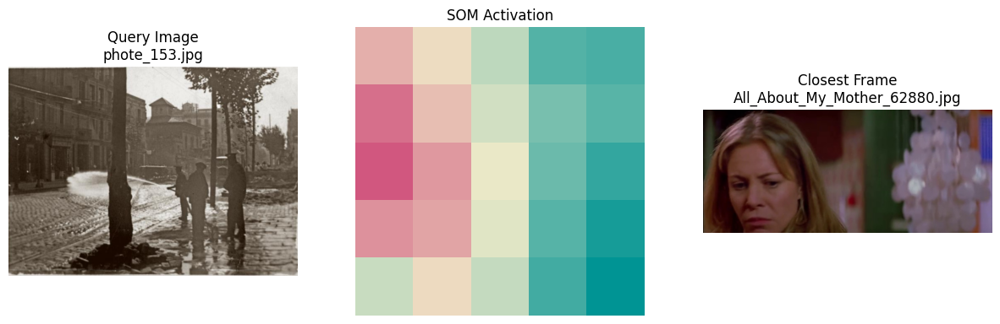

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_153.jpg_62880_63000.mp4

 ------[ SEARCHING EXAMPLE 2 ]------------------------------------------------------------

query: In the world of finance, market volatility can create opportunities for savvy investors to capitalize on fluctuations and generate profits.


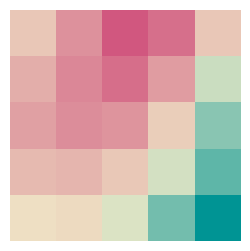

best matched unit: (0, 2) 

[({'paragraph': " This is my son Jorge.'Julian held out his hand, and Jorge Aldaya shook it. His touch was lukewarm, unenthusiastic, and his face had a pale, chiselled look that came from having grown up in that doll-like world.", 'nr': 1428, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.41691959]]))]


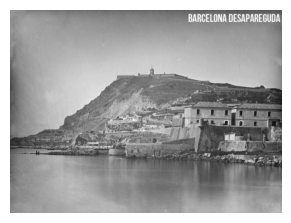

file name: phote_73.jpg
Paragraph: ?

In the picture, you can see a town situated on a mountain top with a castle-like building.

---------------
1/1 [==============================] - 0s 97ms/step


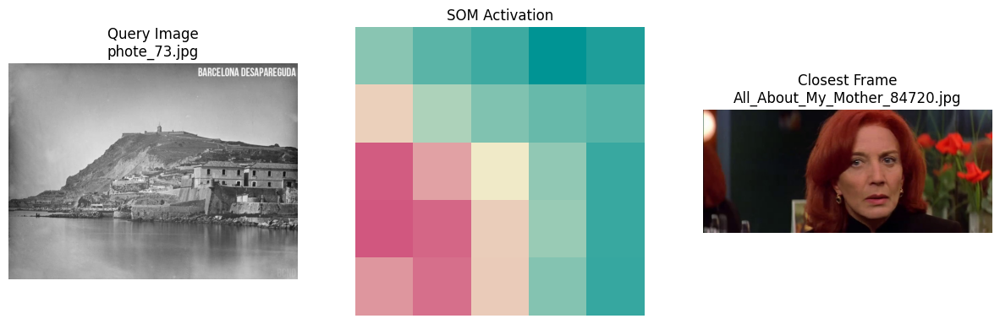

subtitle: It was crazy to wait in the rain... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_73.jpg_84720_84840.mp4

 ------[ SEARCHING EXAMPLE 3 ]------------------------------------------------------------

query: The scientist carefully observed the reaction under the microscope, noting the subtle changes in color and composition as the experiment progressed.


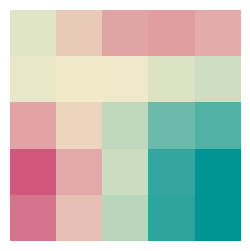

best matched unit: (3, 0) 

[({'paragraph': " 'People have no shame. What a country of pigs we live in.''You'd better lower your voice, Fermin,' I advised him.Fermin Romero de Torres wasn't listening to me. He was lost in the gentle swell of that miraculous bosom, with an enraptured smile and unblinking eyes.", 'nr': 573, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.19685405]]))]


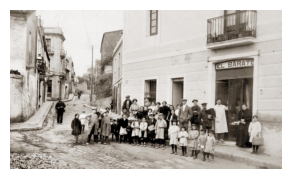

file name: phote_187.jpg
Paragraph:  a group of people standing on a street.
---------------
1/1 [==============================] - 0s 105ms/step


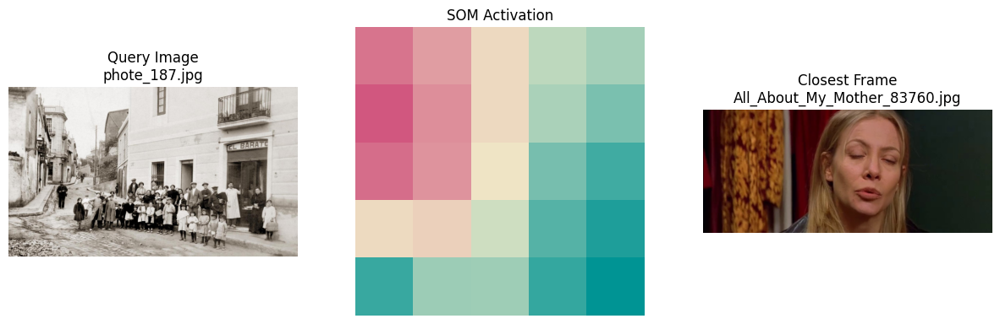

subtitle: Twenty years ago, I played Stella with an amateur group. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_187.jpg_83760_83880.mp4

 ------[ SEARCHING EXAMPLE 4 ]------------------------------------------------------------

query: As the chef meticulously plated the dish, he garnished it with fresh herbs and drizzled a delicate sauce, transforming the ingredients into a culinary masterpiece.


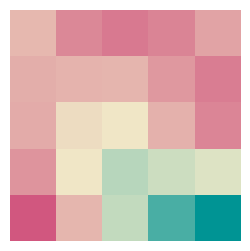

best matched unit: (4, 0) 

[({'paragraph': ' "See! It doesn\'t leak." "I want another one, too. A big one." He took down a big one that would hold a gallon or more, from the roof. He blew it up, his cheeks puffing ahead of the wine-skin, and stood on the bota holding on to a chair.', 'nr': 911, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.17180987]]))]


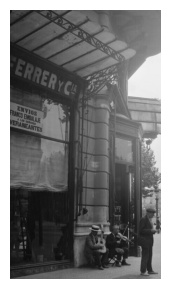

file name: phote_116.jpg
Paragraph: In the picture, there are four men sitting on a bench in front of a building. They are playing musical instruments, with one man holding a violin and another man holding a trumpet. Another man is wearing a suit and tie, possibly as a musician or a performer.

There are a couple of chairs visible in the area, with one close to the men playing instruments and another chair further away. A handbag is resting on the ground nearby. Additionally, there are two potted plants in the area, one close to the men playing instruments and the other further away.
---------------
1/1 [==============================] - 0s 60ms/step


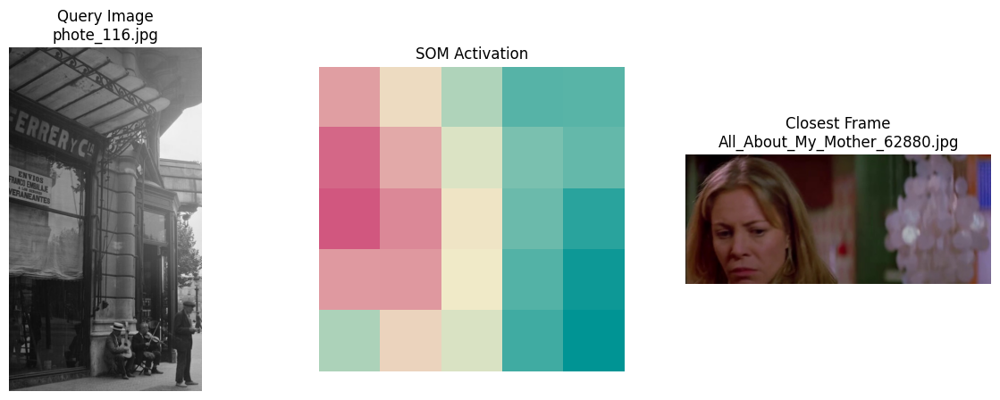

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_116.jpg_62880_63000.mp4

 ------[ SEARCHING EXAMPLE 5 ]------------------------------------------------------------

query: The protagonist of the novel embarked on a perilous journey through uncharted lands, facing challenges and discovering hidden truths along the way.


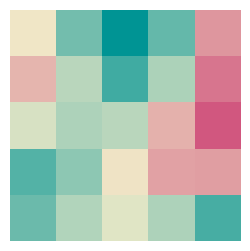

best matched unit: (2, 4) 

[({'paragraph': " That way there's no enigma, I can assure you. No Holy Trinity.'That afternoon, as he drove up Avenida del Tibidabo, Julian thought he was entering the doors of paradise. Mansions that seemed like cathedrals flanked the way.", 'nr': 1422, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.42661496]]))]


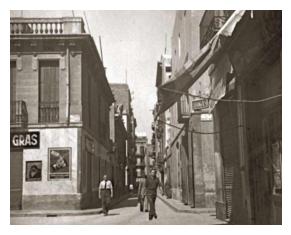

file name: phote_142.jpg
Paragraph: In the picture, two men are walking down a narrow street between two buildings. One of the men is wearing a tie, indicating that they might be businessmen. The scene captures the essence of a city street where people are navigating their way through the cityscape.
---------------
1/1 [==============================] - 0s 61ms/step


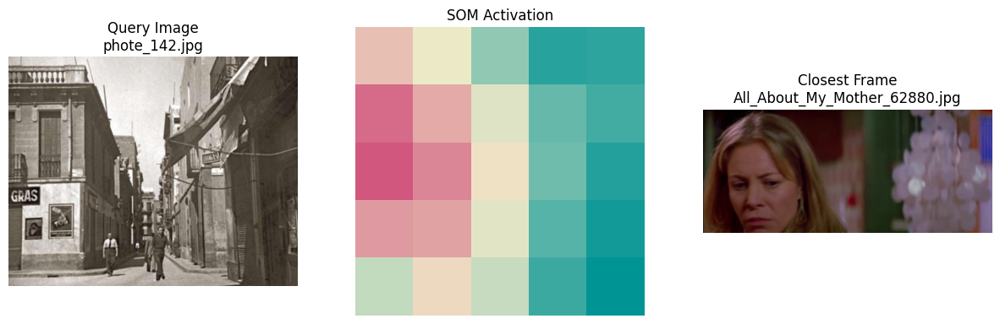

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_142.jpg_62880_63000.mp4

 ------[ SEARCHING EXAMPLE 6 ]------------------------------------------------------------

query: In the realm of technology, innovation drives progress, with each breakthrough paving the way for new possibilities and advancements.


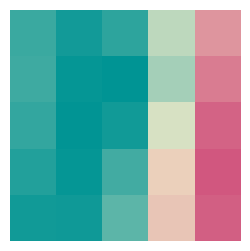

best matched unit: (3, 4) 

[({'paragraph': " That way there's no enigma, I can assure you. No Holy Trinity.'That afternoon, as he drove up Avenida del Tibidabo, Julian thought he was entering the doors of paradise. Mansions that seemed like cathedrals flanked the way.", 'nr': 1422, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.49737637]]))]


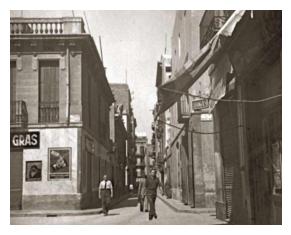

file name: phote_142.jpg
Paragraph: In the picture, two men are walking down a narrow street between two buildings. One of the men is wearing a tie, indicating that they might be businessmen. The scene captures the essence of a city street where people are navigating their way through the cityscape.
---------------
1/1 [==============================] - 0s 62ms/step


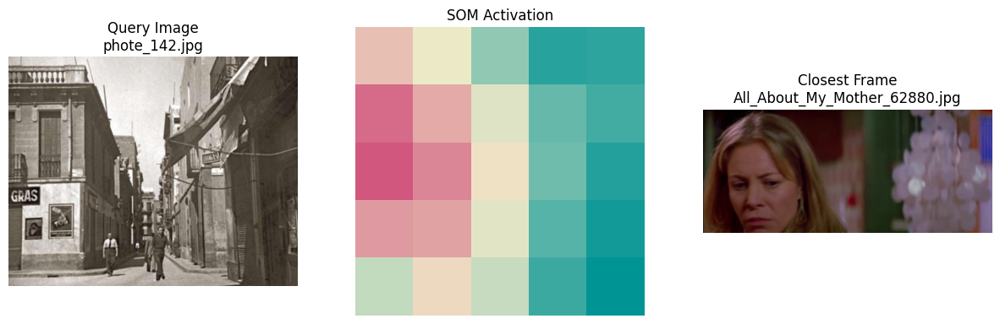

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_142.jpg_62880_63000.mp4

 ------[ SEARCHING EXAMPLE 7 ]------------------------------------------------------------

query: The artist stood back to admire the masterpiece on the canvas, marvelling at how each brushstroke conveyed emotion and depth.


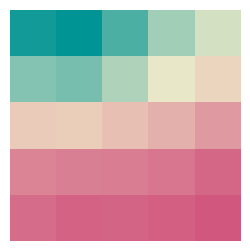

best matched unit: (4, 4) 

[({'paragraph': "'I wondered whether that was a compliment or a condemnation.'We can't be seen together, Daniel. Not like this, in full view of everyone.''If you like, we can go into the bookshop. There's a coffeepot in the back room and—''No.", 'nr': 1567, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.32961481]]))]


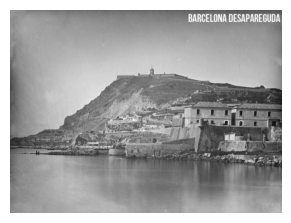

file name: phote_73.jpg
Paragraph: ?

In the picture, you can see a town situated on a mountain top with a castle-like building.

---------------
1/1 [==============================] - 0s 66ms/step


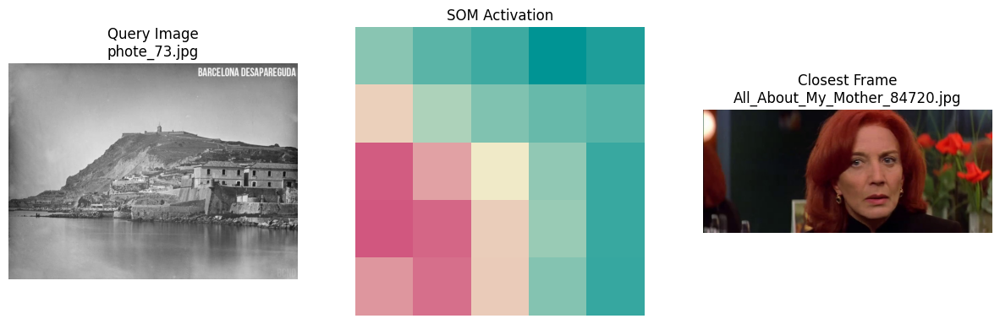

subtitle: It was crazy to wait in the rain... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_73.jpg_84720_84840.mp4

 ------[ SEARCHING EXAMPLE 8 ]------------------------------------------------------------

query: Amidst the hustle and bustle of the city streets, the weary traveler found solace in the quietude of a quaint café, sipping coffee and watching the world go by.


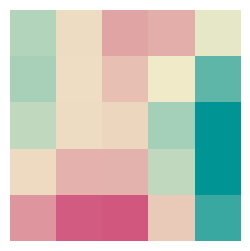

best matched unit: (4, 2) 

[({'paragraph': " 'The other day it was on the radio: the universe is full of mysteries. Imagine, they think they've found the Holy Shroud, the real one, bang in downtown Toledo. It had been sewn to a cinema screen, to hide it from the Muslims.", 'nr': 988, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.25994434]]))]


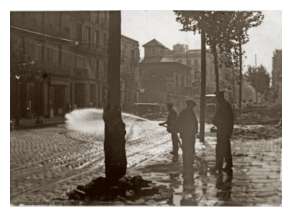

file name: phote_153.jpg
Paragraph: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.

---------------
1/1 [==============================] - 0s 73ms/step


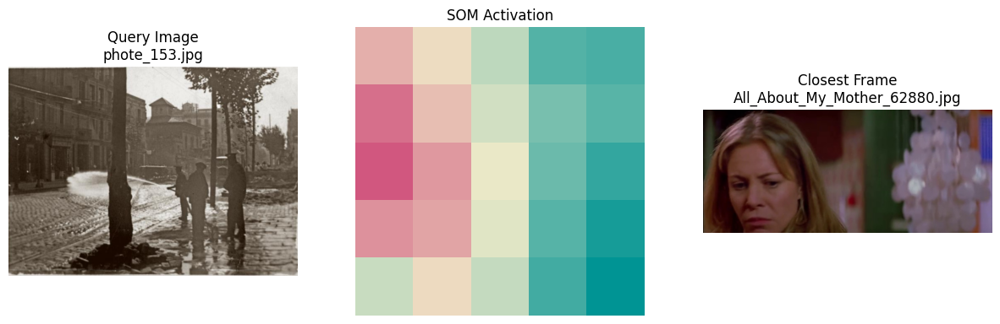

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_153.jpg_62880_63000.mp4

 ------[ SEARCHING EXAMPLE 9 ]------------------------------------------------------------

query: The courtroom fell silent as the judge delivered the verdict, the tension palpable as the fate of the accused hung in the balance.


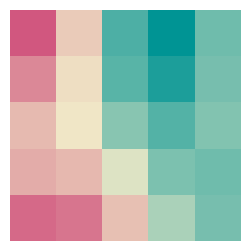

best matched unit: (0, 0) 

[({'paragraph': ' Rather later than sooner, I\'d say. Barcelona fell in a matter of days, and now the boot was on the other foot. I became a persecuted criminal, and my superiors were forced to hide like rats. Naturally, Fumero was already in charge of the "cleanup" operation.', 'nr': 2260, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.304663]]))]


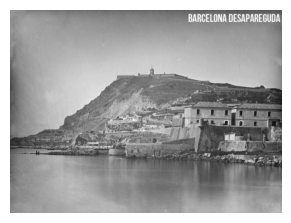

file name: phote_73.jpg
Paragraph: ?

In the picture, you can see a town situated on a mountain top with a castle-like building.

---------------
1/1 [==============================] - 0s 59ms/step


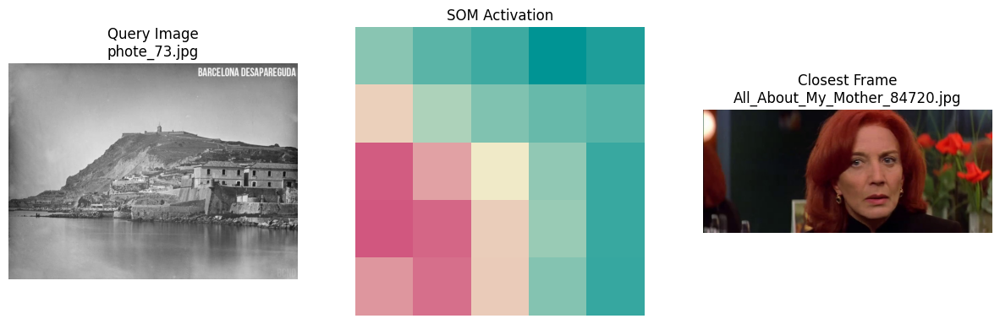

subtitle: It was crazy to wait in the rain... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_73.jpg_84720_84840.mp4

 ------[ SEARCHING EXAMPLE 10 ]------------------------------------------------------------

query: As the final notes of the symphony faded into the night, the audience erupted into applause, moved by the music's haunting beauty and emotional resonance.


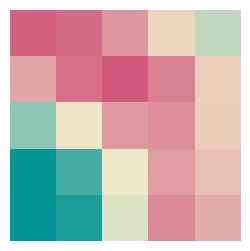

best matched unit: (1, 2) 

[({'paragraph': "Fermin looked at me in amazement. 'With Nuria Monfort? I'm beginning to think I was wrong about you, Daniel. You've become quite a rake.''It's not what you think, Fermin.''That's your loss, then. At your age I was like El Molino music hall -shows morning, afternoon, and night.", 'nr': 1277, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.36935788]]))]


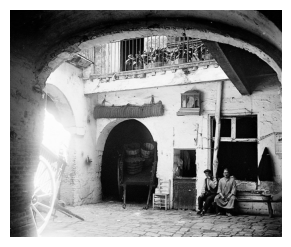

file name: phote_112.jpg
Paragraph: A black and white photo shows a man standing next to a woman sitting on a bench.

---------------
1/1 [==============================] - 0s 59ms/step


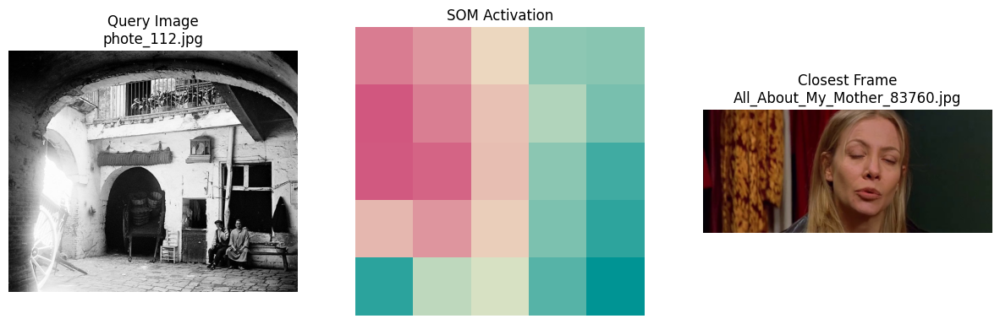

subtitle: Twenty years ago, I played Stella with an amateur group. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example01_phote_112.jpg_83760_83880.mp4


In [323]:
n = 1
for query in query_list:
  print(f"\n ------[ SEARCHING EXAMPLE {n} ]------------------------------------------------------------\n")
  n += 1
  from_text_search(query, "example01")


## [02] input **image** to image — text — video

In [389]:
def from_image_search(query, imagename):
    # image to image
    closest_info = search_imageSOM(query)
    query02_1 = closest_info["description"]

    # image to text
    query02_2 = search_textSOM(query02_1, n=1)[0][0]['paragraph']

    # text to video
    film_results = pkl_text_model.search(query02_2, n=1)

    # Show frame results
    show_frame_results(film_results, imagename)

Activate with 10 inputs


 ------[ SEARCHING EXAMPLE 1 ]------------------------------------------------------------

1/1 [==============================] - 0s 107ms/step


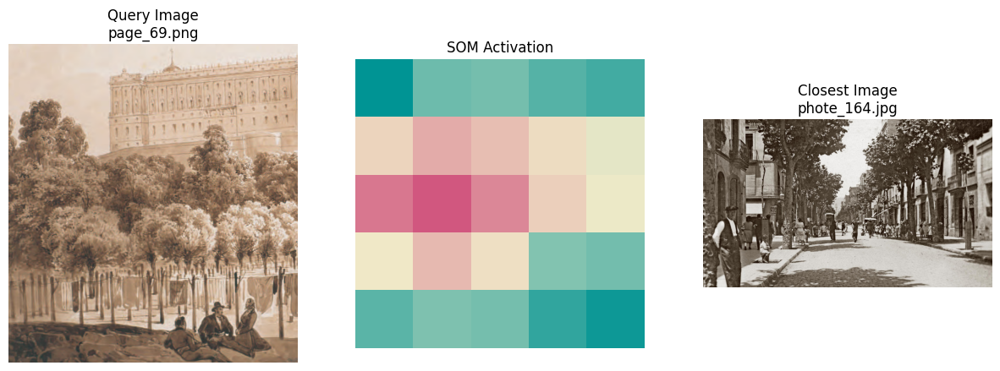

Description of the closest image: A group of men, women, and children standing and walking on a sidewalk
query: A group of men, women, and children standing and walking on a sidewalk


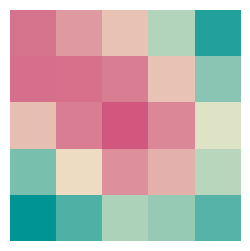

[({'paragraph': " They seemed happy, or at peace, as if those helpless little beings could fill all the emptiness in the world. Then I would remember the days when, fantasizing, I had imagined myself as one of those women, with a child in my arms, Julian's child.", 'nr': 3066, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.57297829]]))]


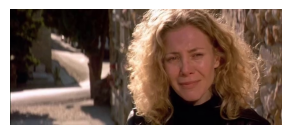

frame: All_About_My_Mother_121920.jpg
Paragraph: When I left Barcelona, I was carrying your child.  What? 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_121920_122040.mp4
---------------

 ------[ SEARCHING EXAMPLE 2 ]------------------------------------------------------------

1/1 [==============================] - 0s 104ms/step


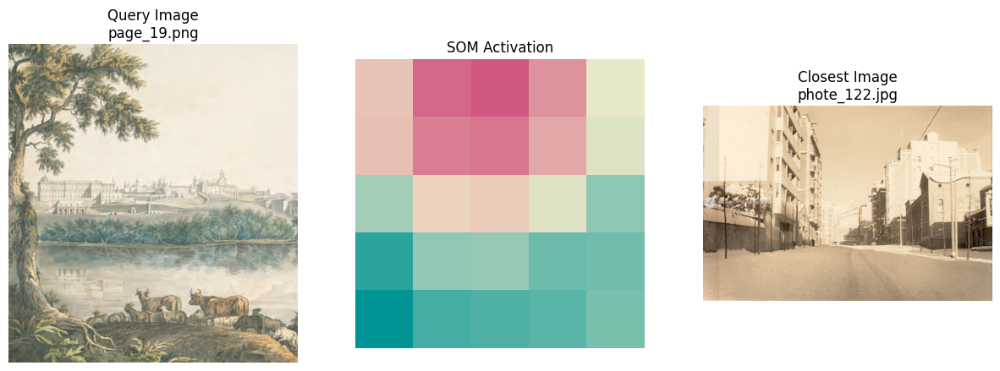

Description of the closest image: What is the building made of?

The building is made of concrete.

query: What is the building made of?

The building is made of concrete.



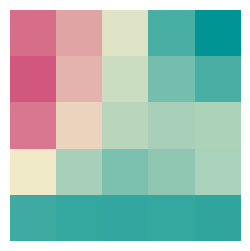

[({'paragraph': ' I liked to see him hurt Cohn. I wished he would not do it, though, because afterward it made me disgusted at myself. That was morality; things that made you disgusted afterward. No, that must be immorality.', 'nr': 862, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.6097168]]))]


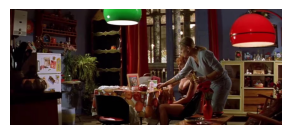

frame: All_About_My_Mother_37080.jpg
Paragraph: 300,000 pesetas.  What hurt most was... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37080_37200.mp4
---------------

 ------[ SEARCHING EXAMPLE 3 ]------------------------------------------------------------

1/1 [==============================] - 0s 62ms/step


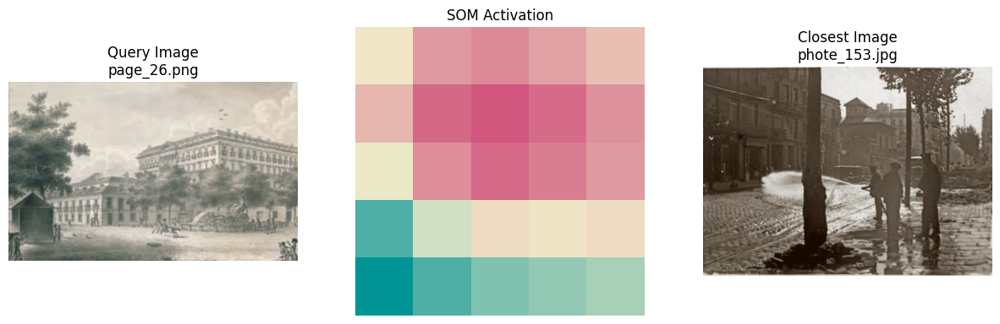

Description of the closest image: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.

query: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.



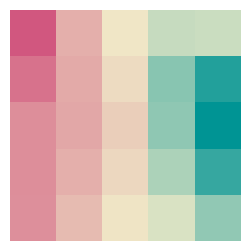

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.34476628]]))]


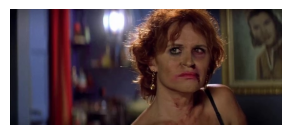

frame: All_About_My_Mother_37800.jpg
Paragraph: Are you looking for her? 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37800_37920.mp4
---------------

 ------[ SEARCHING EXAMPLE 4 ]------------------------------------------------------------

1/1 [==============================] - 0s 57ms/step


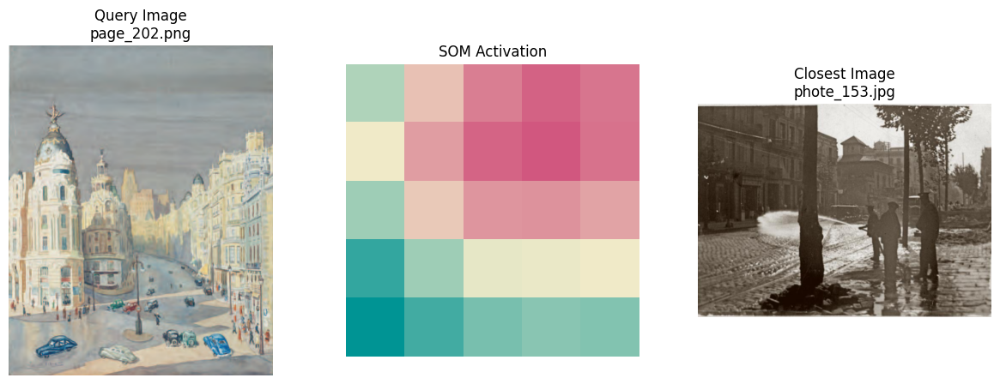

Description of the closest image: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.

query: In the picture, three men are standing on a street corner, possibly on a rainy day. They are standing next to a pole and a tree, possibly discussing something or waiting for someone.



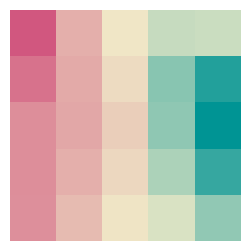

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.34476628]]))]


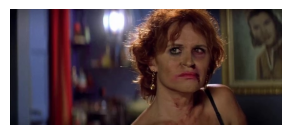

frame: All_About_My_Mother_37800.jpg
Paragraph: Are you looking for her? 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37800_37920.mp4
---------------

 ------[ SEARCHING EXAMPLE 5 ]------------------------------------------------------------

1/1 [==============================] - 0s 91ms/step


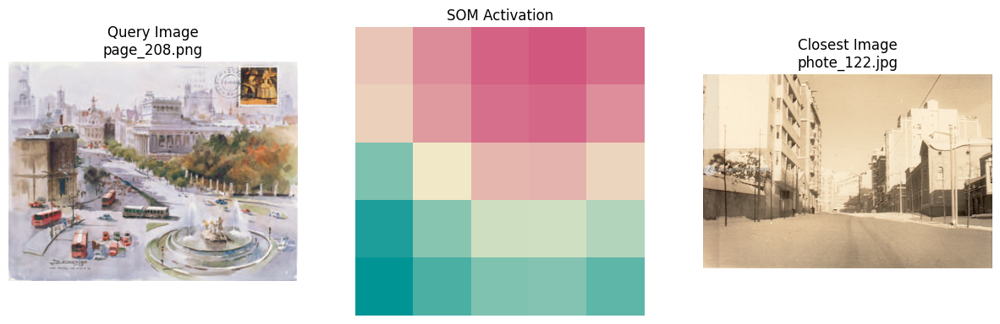

Description of the closest image: What is the building made of?

The building is made of concrete.

query: What is the building made of?

The building is made of concrete.



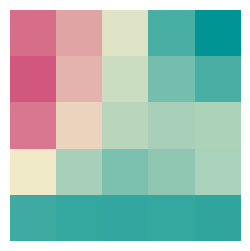

[({'paragraph': ' I liked to see him hurt Cohn. I wished he would not do it, though, because afterward it made me disgusted at myself. That was morality; things that made you disgusted afterward. No, that must be immorality.', 'nr': 862, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.6097168]]))]


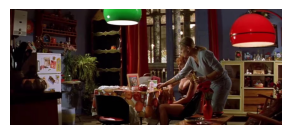

frame: All_About_My_Mother_37080.jpg
Paragraph: 300,000 pesetas.  What hurt most was... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37080_37200.mp4
---------------

 ------[ SEARCHING EXAMPLE 6 ]------------------------------------------------------------

1/1 [==============================] - 0s 65ms/step


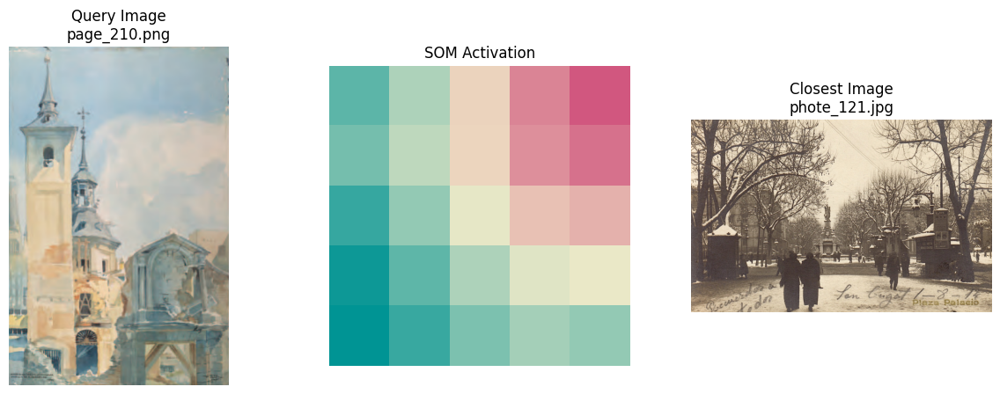

Description of the closest image: A picture of an old-fashioned photo is featured in the picture.

query: A picture of an old-fashioned photo is featured in the picture.



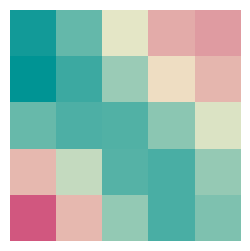

[({'paragraph': " During the journey I had often wondered how I would recognize Julian. The photographs I'd seen of him in Miquel Moliner's collection were at least thirteen or fourteen years old. I looked up and down the platform.", 'nr': 2553, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.48191649]]))]


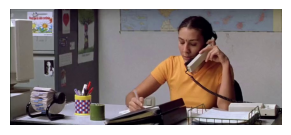

frame: All_About_My_Mother_3720.jpg
Paragraph: Give me the details.  Male, 35 years old. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_3720_3840.mp4
---------------

 ------[ SEARCHING EXAMPLE 7 ]------------------------------------------------------------

1/1 [==============================] - 0s 62ms/step


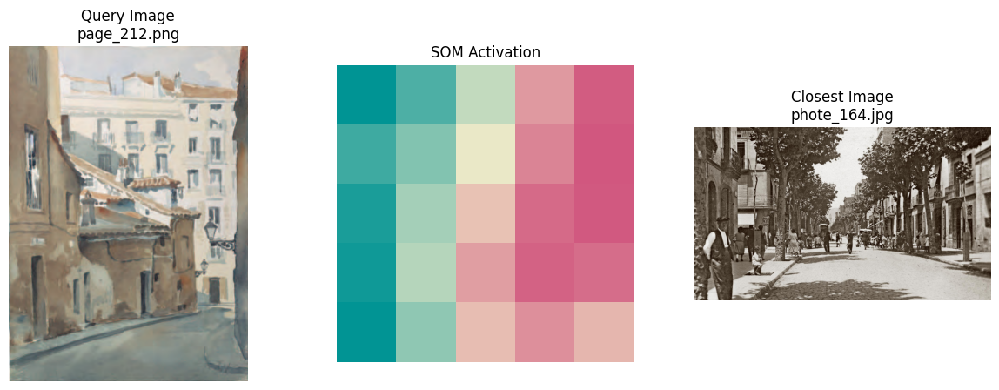

Description of the closest image: A group of men, women, and children standing and walking on a sidewalk
query: A group of men, women, and children standing and walking on a sidewalk


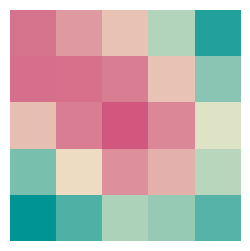

[({'paragraph': " They seemed happy, or at peace, as if those helpless little beings could fill all the emptiness in the world. Then I would remember the days when, fantasizing, I had imagined myself as one of those women, with a child in my arms, Julian's child.", 'nr': 3066, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.57297829]]))]


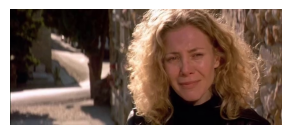

frame: All_About_My_Mother_121920.jpg
Paragraph: When I left Barcelona, I was carrying your child.  What? 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_121920_122040.mp4
---------------

 ------[ SEARCHING EXAMPLE 8 ]------------------------------------------------------------

1/1 [==============================] - 0s 57ms/step


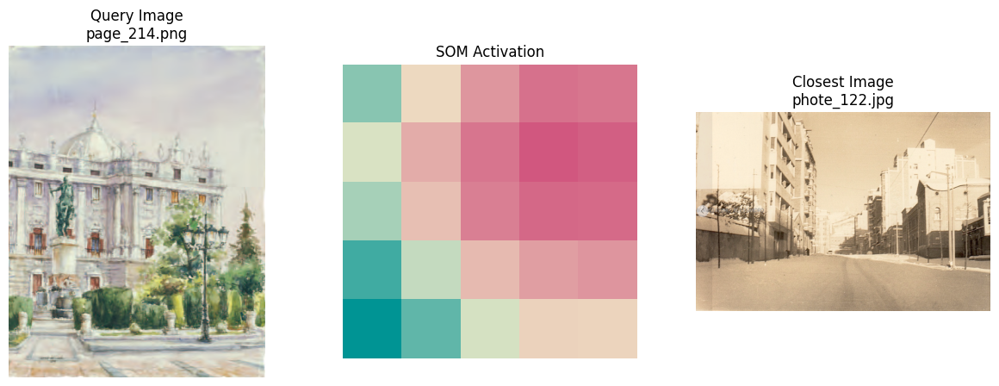

Description of the closest image: What is the building made of?

The building is made of concrete.

query: What is the building made of?

The building is made of concrete.



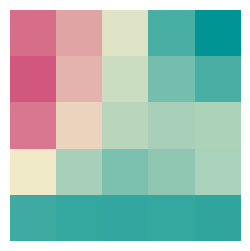

[({'paragraph': ' I liked to see him hurt Cohn. I wished he would not do it, though, because afterward it made me disgusted at myself. That was morality; things that made you disgusted afterward. No, that must be immorality.', 'nr': 862, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.6097168]]))]


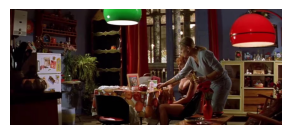

frame: All_About_My_Mother_37080.jpg
Paragraph: 300,000 pesetas.  What hurt most was... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37080_37200.mp4
---------------

 ------[ SEARCHING EXAMPLE 9 ]------------------------------------------------------------

1/1 [==============================] - 0s 90ms/step


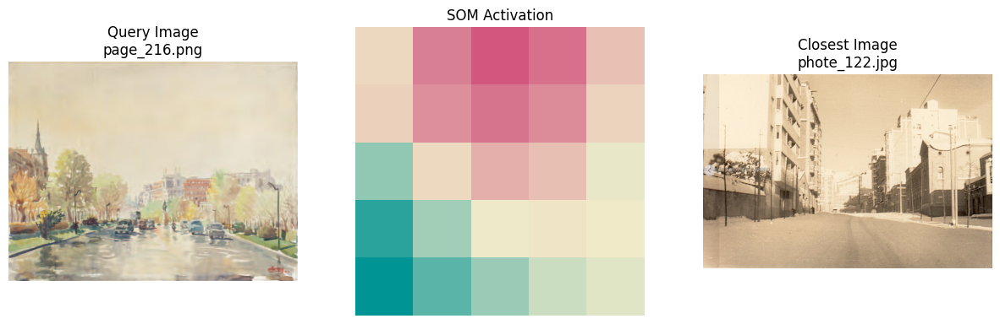

Description of the closest image: What is the building made of?

The building is made of concrete.

query: What is the building made of?

The building is made of concrete.



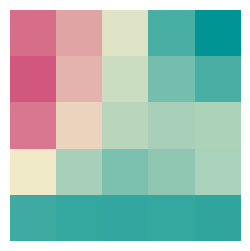

[({'paragraph': ' I liked to see him hurt Cohn. I wished he would not do it, though, because afterward it made me disgusted at myself. That was morality; things that made you disgusted afterward. No, that must be immorality.', 'nr': 862, 'ID': 'the-sun-also-rises', 'type': 'epub'}, array([[0.6097168]]))]


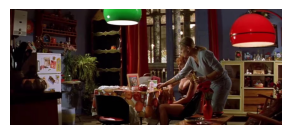

frame: All_About_My_Mother_37080.jpg
Paragraph: 300,000 pesetas.  What hurt most was... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_37080_37200.mp4
---------------

 ------[ SEARCHING EXAMPLE 10 ]------------------------------------------------------------

1/1 [==============================] - 0s 57ms/step


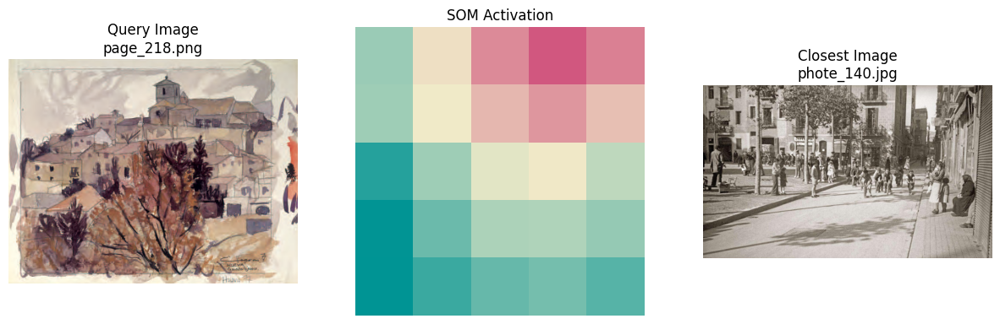

Description of the closest image: This photograph is a black and white photograph depicting a street scene, possibly from the 1950s.
query: This photograph is a black and white photograph depicting a street scene, possibly from the 1950s.


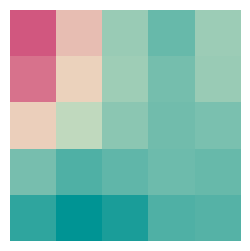

[({'paragraph': " During the journey I had often wondered how I would recognize Julian. The photographs I'd seen of him in Miquel Moliner's collection were at least thirteen or fourteen years old. I looked up and down the platform.", 'nr': 2553, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.38137648]]))]


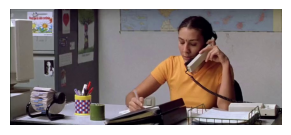

frame: All_About_My_Mother_3720.jpg
Paragraph: Give me the details.  Male, 35 years old. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/example02_3720_3840.mp4
---------------


In [432]:
query_folder = "/content/drive/MyDrive/Fianl_Julian/database/input_image"

query_files = os.listdir(query_folder)
n=1
for query_file in query_files:
  print(f"\n ------[ SEARCHING EXAMPLE {n} ]------------------------------------------------------------\n")
  n+=1
  query_path = os.path.join(query_folder, query_file)
  from_image_search(query_path, "example02")

## [03] input **video** to video — image — text

In [540]:
def extract_middle_frame(video_path, save_path):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    middle_frame_index = total_frames // 2
    cap.set(cv2.CAP_PROP_POS_FRAMES, middle_frame_index)
    ret, frame = cap.read()
    cap.release()
    cv2.imwrite(save_path, frame)


def generate_frame_save_path(video_path, save_folder):
    # 提取文件名（不含路径）
    video_filename = os.path.basename(video_path)
    # 获取文件名（不含扩展名）
    frame_name = os.path.splitext(video_filename)[0]
    # 生成保存路径
    save_path = os.path.join(save_folder, f"{frame_name}.jpg")
    return save_path

In [541]:
def from_video_search(query,imagename):
  save_path = generate_frame_save_path (query, "/content/drive/MyDrive/Fianl_Julian/database/input_video/frame/")
  extract_middle_frame(query, save_path)
  clip_name= search_videoSOM(save_path, imagename)["image"]

  query03_1 = f"/content/drive/MyDrive/Fianl_Julian/database/film_screenshot/{clip_name}"
  query03_2 = search_imageSOM(query03_1)["description"]

  search_textSOM(query03_2, n=1)

1/1 [==============================] - 0s 66ms/step


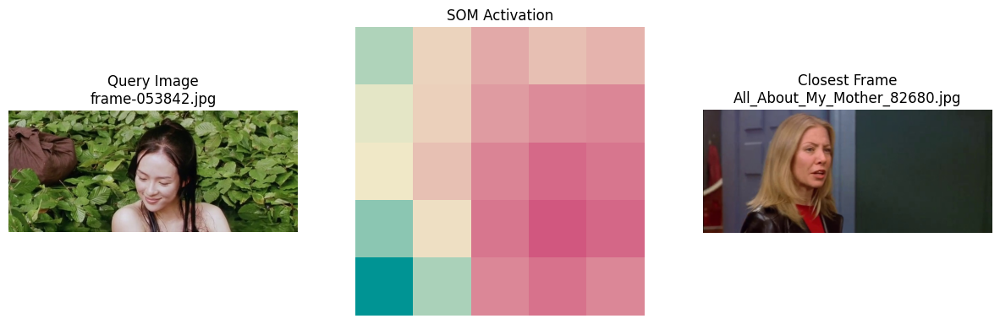

subtitle: You think I'm stupid?  The loudspeakers helped me remember it. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-053842.jpg_82680_82800.mp4
1/1 [==============================] - 0s 57ms/step


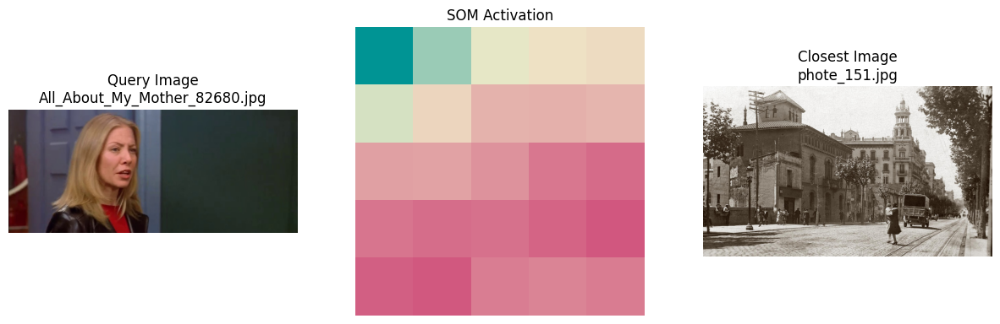

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


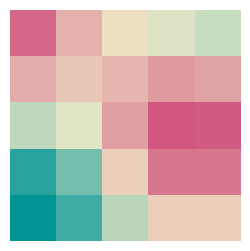

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 108ms/step


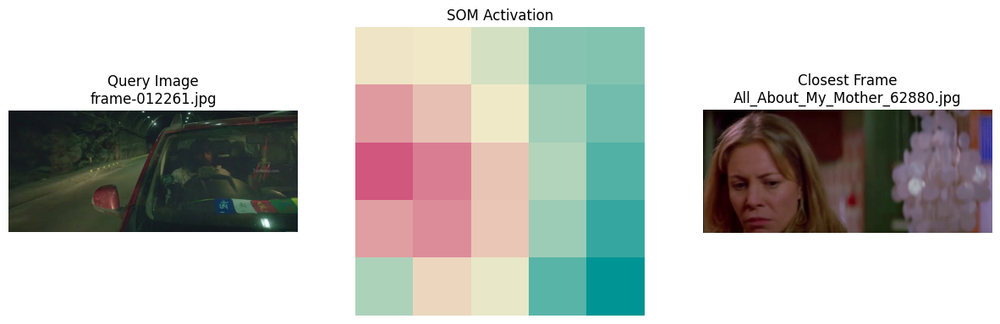

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-012261.jpg_62880_63000.mp4
1/1 [==============================] - 0s 53ms/step


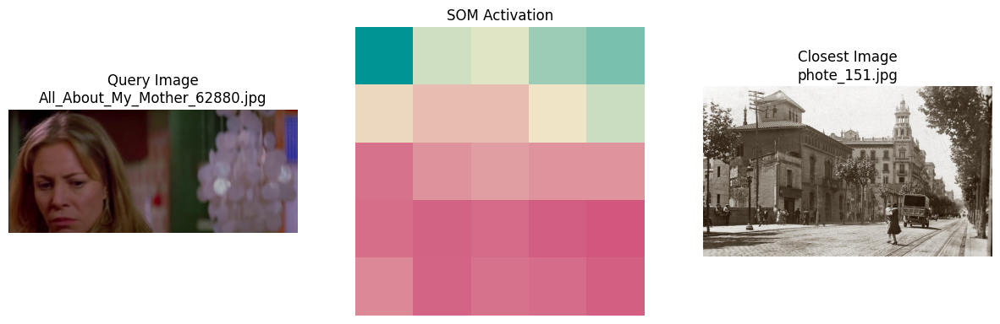

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


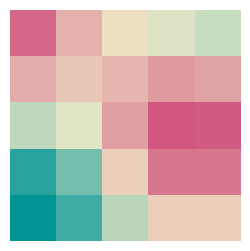

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 113ms/step


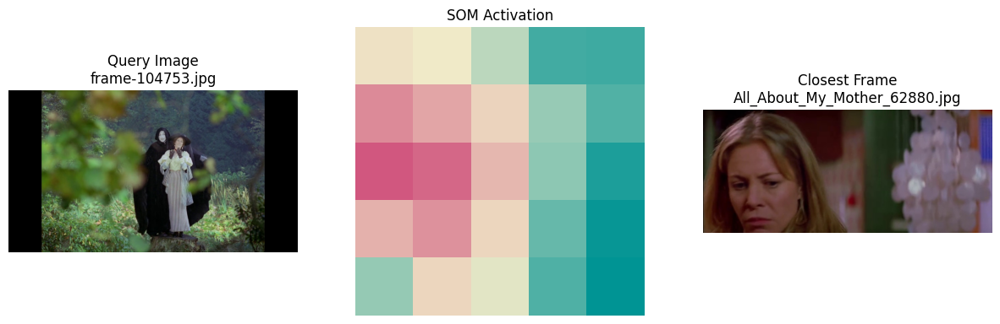

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-104753.jpg_62880_63000.mp4
1/1 [==============================] - 0s 57ms/step


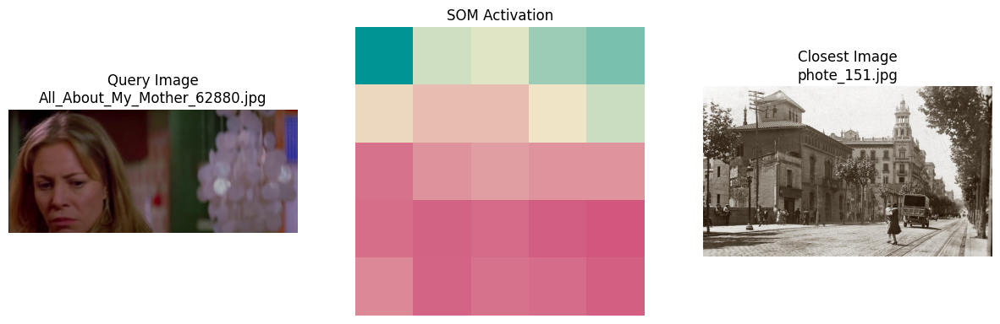

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


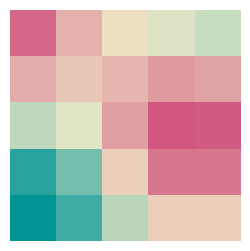

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 121ms/step


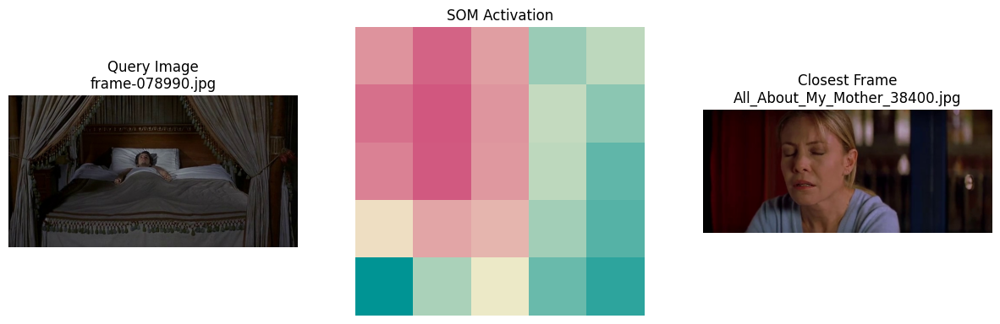

subtitle: Some other day. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-078990.jpg_38400_38520.mp4
1/1 [==============================] - 0s 90ms/step


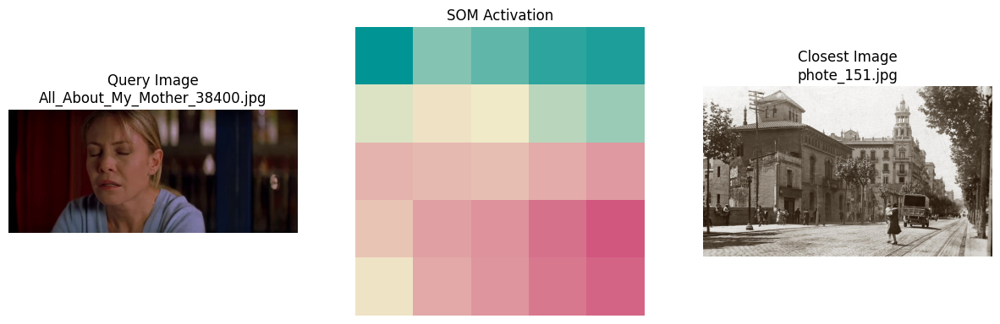

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


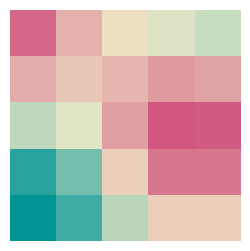

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 60ms/step


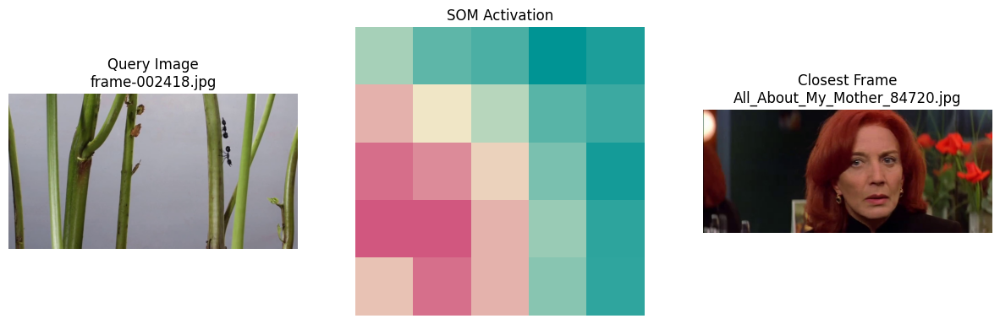

subtitle: It was crazy to wait in the rain... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-002418.jpg_84720_84840.mp4
1/1 [==============================] - 0s 55ms/step


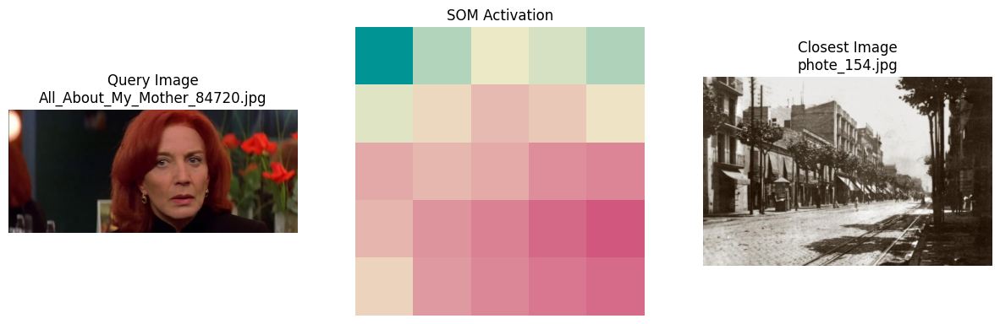

Description of the closest image: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical urban street with pedestrians navigating the area.
query: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical ur

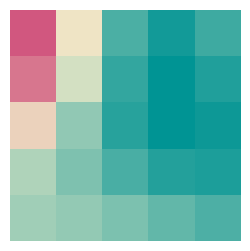

[({'paragraph': ' It was a Sunday, and a lot of people had still come out onto the streets thinking they would spend the day picnicking along the road to Las Planas. The blackest days of the war in Barcelona, however, were still two years away.', 'nr': 2815, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.41538284]]))]
1/1 [==============================] - 0s 56ms/step


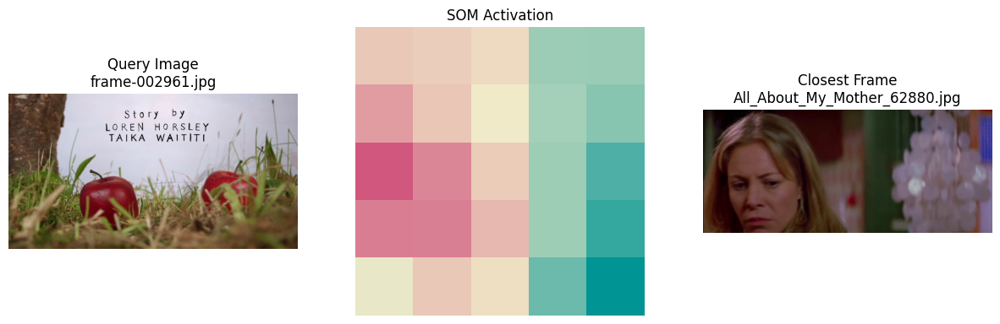

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-002961.jpg_62880_63000.mp4
1/1 [==============================] - 0s 58ms/step


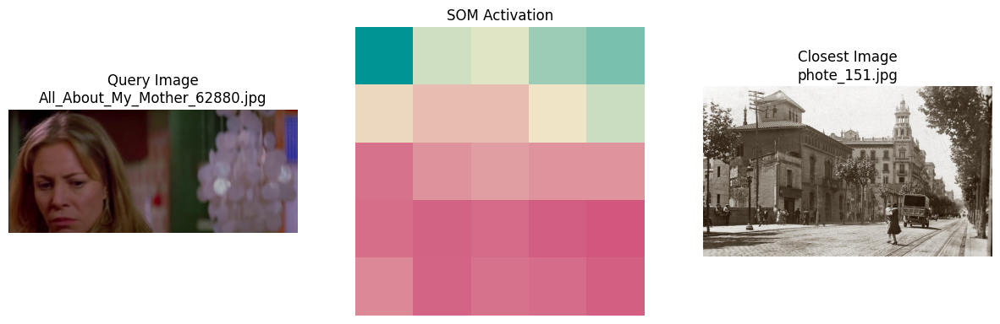

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


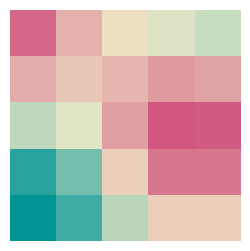

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 110ms/step


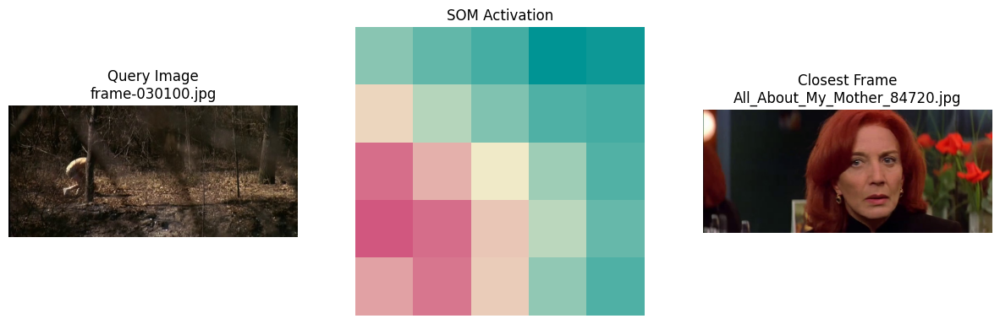

subtitle: It was crazy to wait in the rain... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-030100.jpg_84720_84840.mp4
1/1 [==============================] - 0s 61ms/step


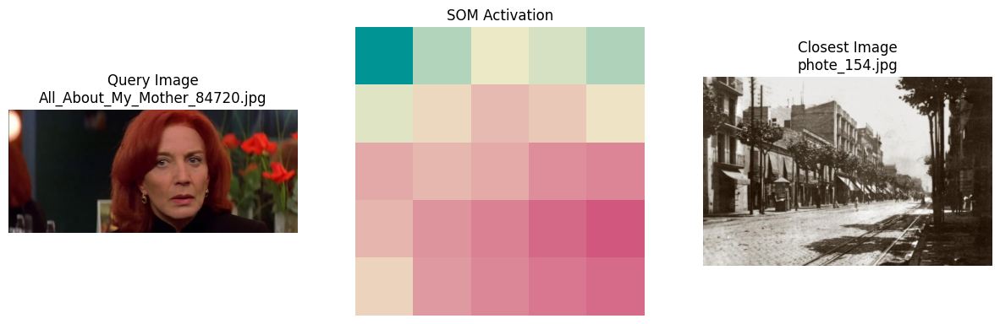

Description of the closest image: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical urban street with pedestrians navigating the area.
query: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical ur

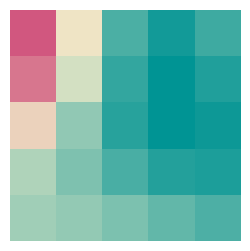

[({'paragraph': ' It was a Sunday, and a lot of people had still come out onto the streets thinking they would spend the day picnicking along the road to Las Planas. The blackest days of the war in Barcelona, however, were still two years away.', 'nr': 2815, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.41538284]]))]
1/1 [==============================] - 0s 63ms/step


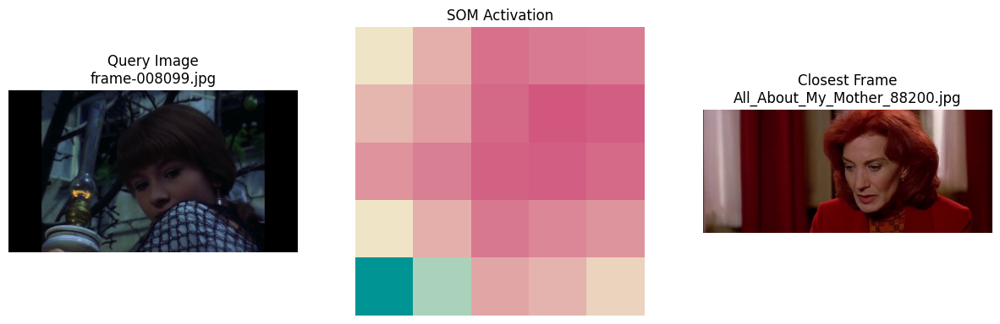

subtitle: and finish your run with the company. 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-008099.jpg_88200_88320.mp4
1/1 [==============================] - 0s 117ms/step


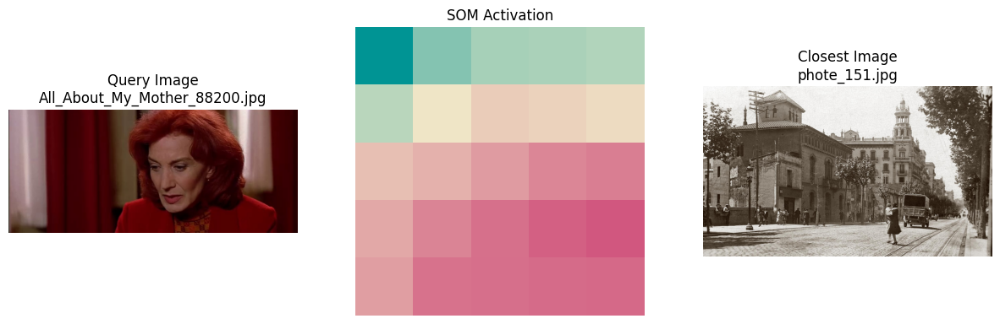

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


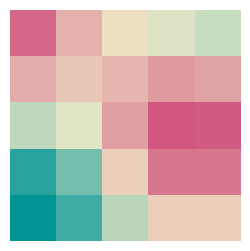

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]
1/1 [==============================] - 0s 59ms/step


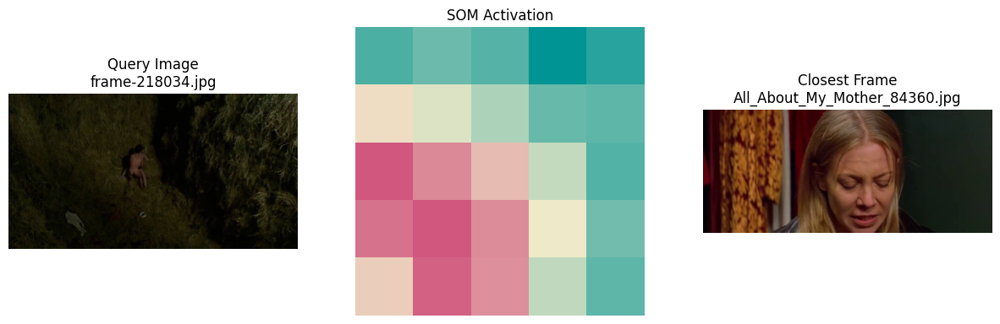

subtitle: It was pouring rain, but we waited outside... 
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-218034.jpg_84360_84480.mp4
1/1 [==============================] - 0s 62ms/step


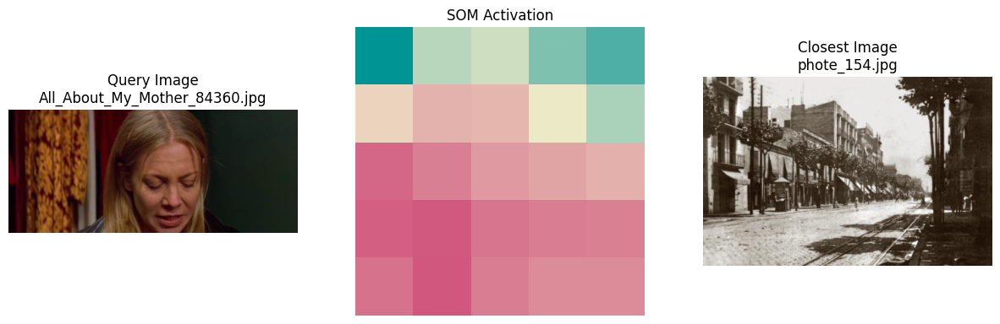

Description of the closest image: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical urban street with pedestrians navigating the area.
query: In the picture, there is a street with buildings and a trolley track running alongside it. The street is surrounded by tall buildings, and people are walking and standing on the sidewalk. The trolley track runs along the street, and there are people walking and standing on the trolley tracks as well.

There are multiple people walking and standing along the sidewalk, some closer to the buildings and others farther away. The scene captures a typical ur

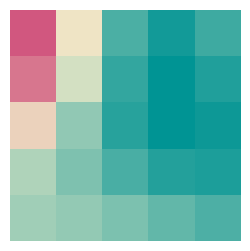

[({'paragraph': ' It was a Sunday, and a lot of people had still come out onto the streets thinking they would spend the day picnicking along the road to Las Planas. The blackest days of the war in Barcelona, however, were still two years away.', 'nr': 2815, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.41538284]]))]
1/1 [==============================] - 0s 66ms/step


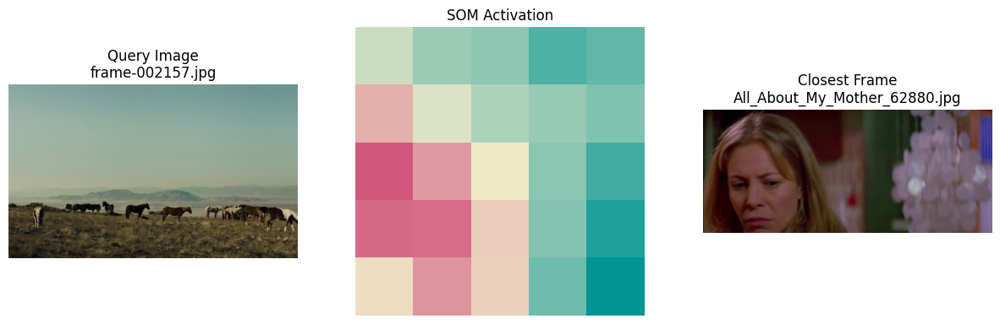

subtitle:  
Video clip extracted and saved to /content/drive/MyDrive/Fianl_Julian/output_clips/cese3_frame-002157.jpg_62880_63000.mp4
1/1 [==============================] - 0s 59ms/step


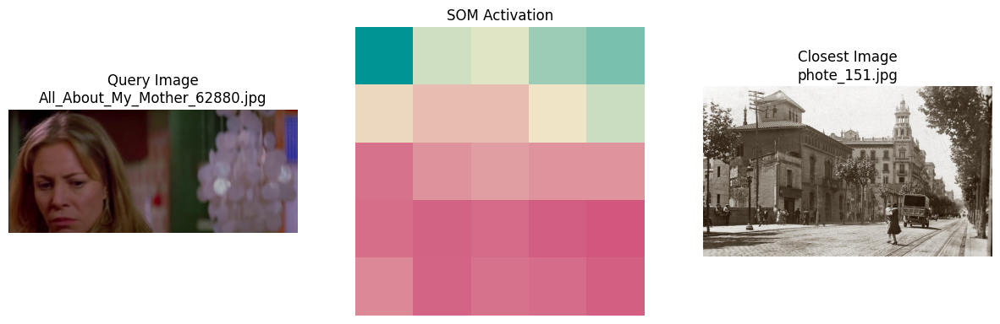

Description of the closest image: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.
query: In the picture, there is a large building with arches and windows, and a man driving a horse-drawn carriage is visible.


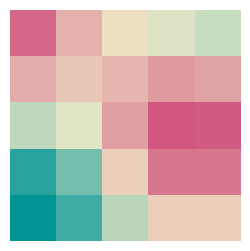

[({'paragraph': " There was nobody there except that figure and me. I noticed that the man was looking at me with some curiosity: perhaps he, too, was waiting for someone. It couldn't be him. According to my calculations, Julian would be thirty-three, and that man seemed older.", 'nr': 2554, 'ID': 'The-Shadow-of-the-Wind', 'type': 'epub'}, array([[0.37174659]]))]


error: OpenCV(4.8.0) /io/opencv/modules/imgcodecs/src/loadsave.cpp:787: error: (-215:Assertion failed) !_img.empty() in function 'imwrite'


In [542]:
query_path_all = "/content/drive/MyDrive/Fianl_Julian/database/input_video/"
query_files = []
query_files.extend(glob.glob(os.path.join(query_path_all, '*')))


for query_file in query_files:
    from_video_search(query_file, "cese3")